# Imports

In [1]:
import cv2
import numpy as np
import os
import xml.etree.ElementTree as ET
import json
from typing import Dict, List
import re
import pandas as pd
import re
import matplotlib.pyplot as plt
from tqdm import tqdm
import random
from collections import OrderedDict
from sklearn.model_selection import train_test_split
import timm
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
#from torchsummary import summary
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
assert torch.cuda.is_available()
import math
from glob import glob
from torchvision.ops import nms
#import albumentations as A
from functools import partial
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
# Not always necessary depending on your hardware/GPU
#os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:512"

In [2]:
# Here we dont assume that our images are 512x512 we prefer to use HD images (more common)
input_width = 512
input_height = 512

# Model scale is 16, meaning that in the model prediction, we have heatmaps of dimensions 80 x 45
MODEL_SCALE = 4 #32 #16 #4

# Batch size for training --> if your hardware supports it, try to increase this value
batch_size = 4 #24

folder = r"C:\Users\John\Desktop\notebooks\datasets\Barcode Detection Dataset- mixed.v1i.voc"

In [32]:
def extract_coords(path):

    with open(path, 'r') as file:
        lines = file.readlines()
    
    # Process each line
    # Process each line
    # Process each line
    processed_lines = []
    for line in lines:
        parts = line.strip().split()
        
        # Separate numeric coordinates and the class label
        coordinates = []
        class_label = []
        for part in parts:
            try:
                # Attempt to convert to float, if successful, it is a coordinate
                float_value = float(part)
                coordinates.append(int(float_value))
            except ValueError:
                # If conversion fails, it is part of the class label
                class_label.append(part)
        
        # Join coordinates and class label for the final output
        #processed_line = coordinates #" ".join(map(str, coordinates)) #+ " " + " ".join(class_label)
        processed_lines.append(coordinates)
    return processed_lines

In [33]:
a = extract_coords(path)

In [36]:
a[0][:-1],a

([897, 506, 888, 566, 742, 543, 752, 483],
 [[897, 506, 888, 566, 742, 543, 752, 483, 0],
  [890, 289, 885, 340, 713, 321, 718, 271, 0]])

In [37]:
def draw_gaussian(heatmap, center, radius, k=1):
    diameter = 2 * radius + 1
    gaussian = gaussian2D((diameter, diameter), sigma=diameter / 6)

    x, y = int(center[0]), int(center[1])

    height, width = heatmap.shape[0:2]

    left, right = min(x, radius), min(width - x, radius + 1)
    top, bottom = min(y, radius), min(height - y, radius + 1)

    masked_heatmap = heatmap[y - top:y + bottom, x - left:x + right]
    masked_gaussian = gaussian[radius - top:radius + bottom, radius - left:radius + right]
    if min(masked_gaussian.shape) > 0 and min(masked_heatmap.shape) > 0:  # TODO debug
        np.maximum(masked_heatmap, masked_gaussian * k, out=masked_heatmap)
    return heatmap

def gaussian2D(shape, sigma=1):
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m + 1, -n:n + 1]

    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    h[h < np.finfo(h.dtype).eps * h.max()] = 0
    return h

def gaussian_radius(det_size, min_overlap=0.7):
    height, width = det_size

    a1 = 1
    b1 = (height + width)
    c1 = width * height * (1 - min_overlap) / (1 + min_overlap)
    sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
    r1 = (b1 + sq1) / 2

    a2 = 4
    b2 = 2 * (height + width)
    c2 = (1 - min_overlap) * width * height
    sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
    r2 = (b2 + sq2) / 2

    a3 = 4 * min_overlap
    b3 = -2 * min_overlap * (height + width)
    c3 = (min_overlap - 1) * width * height
    sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
    r3 = (b3 + sq3) / 2
    return min(r1, r2, r3)

def draw_umich_gaussian(heatmap, center, radius, k=1):
    diameter = 2 * radius + 1
    gaussian = gaussian2D((diameter, diameter), sigma=diameter / 6)

    x, y = int(center[0]), int(center[1])

    height, width = heatmap.shape[0:2]

    left, right = min(x, radius), min(width - x, radius + 1)
    top, bottom = min(y, radius), min(height - y, radius + 1)

    masked_heatmap  = heatmap[y - top:y + bottom, x - left:x + right]
    masked_gaussian = gaussian[radius - top:radius + bottom, radius - left:radius + right]
    if min(masked_gaussian.shape) > 0 and min(masked_heatmap.shape) > 0: # TODO debug
        np.maximum(masked_heatmap, masked_gaussian * k, out=masked_heatmap)
    return heatmap


In [38]:
# Make heatmaps using the utility functions from the centernet repo
def draw_msra_gaussian(heatmap, center, sigma=2):
    tmp_size = sigma * 6
    mu_x = int(center[0])
    mu_y = int(center[1])
    w, h = heatmap.shape[0], heatmap.shape[1]
    ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
    br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
    if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
        return heatmap
    size = br[0] - ul[0]
    x = np.arange(0, size, 1, np.float32)
    y = x[:, np.newaxis]
    x0 = y0 = size // 2
    g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
    g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
    g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
    img_x = max(0, ul[0]), min(br[0], h)
    img_y = max(0, ul[1]), min(br[1], w)
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
      heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
      g[g_y[0]:g_y[1], g_x[0]:g_x[1]])

    assert heatmap[mu_y, mu_x] == 1 # Center value must be 1
    return heatmap

# Offsets along x and y are between 0 and 1 and correct quantization errors from center heatmap
def draw_offset(offset, x, y):
    offset[0, int(y), int(x)] = x - int(x)
    offset[1, int(y), int(x)] = y - int(y)
    return offset

In [39]:
def pool_nms(heat, kernel = 3):
    pad = (kernel - 1) // 2

    hmax = nn.functional.max_pool2d(heat, (kernel, kernel), stride=1, padding=pad)
    keep = (hmax == heat).float()
    return heat * keep




def decode_bbox(pred_hms, pred_whs, pred_offsets, confidence=0.3, cuda=True):
    #-------------------------------------------------------------------------#
    #   当利用512x512x3图片进行coco数据集预测的时候
    #   h = w = 128 num_classes = 80
    #   Hot map热力图 -> b, 80, 128, 128,
    #   进行热力图的非极大抑制，利用3x3的卷积对热力图进行最大值筛选
    #   找出一定区域内，得分最大的特征点。
    #-------------------------------------------------------------------------#
    pred_hms = pool_nms(pred_hms)

    b, c, output_h, output_w = pred_hms.shape
    detects = []
    #-------------------------------------------------------------------------#
    #   只传入一张图片，循环只进行一次
    #-------------------------------------------------------------------------#
    for batch in range(b):
        #-------------------------------------------------------------------------#
        #   heat_map        128*128, num_classes    热力图
        #   pred_wh         128*128, 2              特征点的预测宽高
        #                                           在预测过程的前处理以及后处理视频中讲的有点小问题，不是调整参数，就是宽高
        #   pred_offset     128*128, 2              特征点的xy轴偏移情况
        #-------------------------------------------------------------------------#
        heat_map    = pred_hms[batch].permute(1, 2, 0).view([-1, c])
        pred_wh     = pred_whs[batch].permute(1, 2, 0).view([-1, 2])
        pred_offset = pred_offsets[batch].permute(1, 2, 0).view([-1, 2])

        yv, xv      = torch.meshgrid(torch.arange(0, output_h), torch.arange(0, output_w))
        #-------------------------------------------------------------------------#
        #   xv              128*128,    特征点的x轴坐标
        #   yv              128*128,    特征点的y轴坐标
        #-------------------------------------------------------------------------#
        xv, yv      = xv.flatten().float(), yv.flatten().float()
        if cuda:
            xv      = xv.cuda()
            yv      = yv.cuda()

        #-------------------------------------------------------------------------#
        #   class_conf      128*128,    特征点的种类置信度
        #   class_pred      128*128,    特征点的种类
        #-------------------------------------------------------------------------#
        class_conf, class_pred  = torch.max(heat_map, dim = -1)
        mask                    = class_conf > confidence

        #-----------------------------------------#
        #   取出得分筛选后对应的结果
        #-----------------------------------------#
        pred_wh_mask        = pred_wh[mask]
        pred_offset_mask    = pred_offset[mask]
        if len(pred_wh_mask) == 0:
            detects.append([])
            continue

        #----------------------------------------#
        #   计算调整后预测框的中心
        #----------------------------------------#
        xv_mask = torch.unsqueeze(xv[mask] + pred_offset_mask[..., 0], -1)
        yv_mask = torch.unsqueeze(yv[mask] + pred_offset_mask[..., 1], -1)
        #----------------------------------------#
        #   计算预测框的宽高
        #----------------------------------------#
        half_w, half_h = pred_wh_mask[..., 0:1] / 2, pred_wh_mask[..., 1:2] / 2
        #----------------------------------------#
        #   获得预测框的左上角和右下角
        #----------------------------------------#
        bboxes = torch.cat([xv_mask - half_w, yv_mask - half_h, xv_mask + half_w, yv_mask + half_h], dim=1)
        bboxes[:, [0, 2]] /= output_w
        bboxes[:, [1, 3]] /= output_h
        detect = torch.cat([bboxes, torch.unsqueeze(class_conf[mask],-1), torch.unsqueeze(class_pred[mask],-1).float()], dim=-1)
        detects.append(detect)

    return detects

def centernet_correct_boxes(box_xy, box_wh, input_shape, image_shape, letterbox_image):
    #-----------------------------------------------------------------#
    #   把y轴放前面是因为方便预测框和图像的宽高进行相乘
    #-----------------------------------------------------------------#
    box_yx = box_xy[..., ::-1]
    box_hw = box_wh[..., ::-1]
    input_shape = np.array(input_shape)
    image_shape = np.array(image_shape)

    if letterbox_image:
        #-----------------------------------------------------------------#
        #   这里求出来的offset是图像有效区域相对于图像左上角的偏移情况
        #   new_shape指的是宽高缩放情况
        #-----------------------------------------------------------------#
        new_shape = np.round(image_shape * np.min(input_shape/image_shape))
        offset  = (input_shape - new_shape)/2./input_shape
        scale   = input_shape/new_shape

        box_yx  = (box_yx - offset) * scale
        box_hw *= scale

    box_mins    = box_yx - (box_hw / 2.)
    box_maxes   = box_yx + (box_hw / 2.)
    boxes  = np.concatenate([box_mins[..., 0:1], box_mins[..., 1:2], box_maxes[..., 0:1], box_maxes[..., 1:2]], axis=-1)
    boxes *= np.concatenate([image_shape, image_shape], axis=-1)
    return boxes

def postprocess(prediction, need_nms, image_shape, input_shape, letterbox_image, nms_thres=0.4):
    output = [None for _ in range(len(prediction))]

    #----------------------------------------------------------#
    #   预测只用一张图片，只会进行一次
    #----------------------------------------------------------#
    for i, image_pred in enumerate(prediction):
        detections      = prediction[i]
        if len(detections) == 0:
            continue
        #------------------------------------------#
        #   获得预测结果中包含的所有种类
        #------------------------------------------#
        unique_labels   = detections[:, -1].cpu().unique()

        if detections.is_cuda:
            unique_labels = unique_labels.cuda()
            detections = detections.cuda()

        for c in unique_labels:
            #------------------------------------------#
            #   获得某一类得分筛选后全部的预测结果
            #------------------------------------------#
            detections_class = detections[detections[:, -1] == c]
            if need_nms:
                #------------------------------------------#
                #   使用官方自带的非极大抑制会速度更快一些！
                #------------------------------------------#
                keep = nms(
                    detections_class[:, :4],
                    detections_class[:, 4],
                    nms_thres
                )
                max_detections = detections_class[keep]

                # #------------------------------------------#
                # #   按照存在物体的置信度排序
                # #------------------------------------------#
                # _, conf_sort_index = torch.sort(detections_class[:, 4], descending=True)
                # detections_class = detections_class[conf_sort_index]
                # #------------------------------------------#
                # #   进行非极大抑制
                # #------------------------------------------#
                # max_detections = []
                # while detections_class.size(0):
                #     #---------------------------------------------------#
                #     #   取出这一类置信度最高的，一步一步往下判断。
                #     #   判断重合程度是否大于nms_thres，如果是则去除掉
                #     #---------------------------------------------------#
                #     max_detections.append(detections_class[0].unsqueeze(0))
                #     if len(detections_class) == 1:
                #         break
                #     ious = bbox_iou(max_detections[-1], detections_class[1:])
                #     detections_class = detections_class[1:][ious < nms_thres]
                # #------------------------------------------#
                # #   堆叠
                # #------------------------------------------#
                # max_detections = torch.cat(max_detections).data
            else:
                max_detections  = detections_class

            output[i] = max_detections if output[i] is None else torch.cat((output[i], max_detections))

        if output[i] is not None:
            output[i]           = output[i].cpu().numpy()
            box_xy, box_wh      = (output[i][:, 0:2] + output[i][:, 2:4])/2, output[i][:, 2:4] - output[i][:, 0:2]
            output[i][:, :4]    = centernet_correct_boxes(box_xy, box_wh, input_shape, image_shape, letterbox_image)
    return output

In [10]:
def scatter_gaussian_kernel(heatmap, bbox_icx, bbox_icy, bbox_w, bbox_h, alpha=0.54):
    eps = 1e-6
    heatmap_h, heatmap_w = heatmap.shape
    dtype = heatmap.dtype

    area_scale = ((bbox_w * bbox_h) ** 0.2)  # Adjust the exponent for finer control
    std_w = alpha * bbox_w / 6. * area_scale
    std_h = alpha * bbox_h / 6. * area_scale

    var_w = std_w ** 2
    var_h = std_h ** 2
    var_w = var_w + eps
    var_h = var_h + eps
    grid_x, grid_y = np.meshgrid(np.arange(heatmap_w, dtype=dtype), np.arange(heatmap_h, dtype=dtype))

    gaussian_kernel = np.exp(-((grid_x - bbox_icx)**2/(2. * var_w))-((grid_y - bbox_icy)**2/(2. * var_h)))
    gaussian_kernel[bbox_icy, bbox_icx] = 1.
    heatmap = np.maximum(heatmap, gaussian_kernel)
    return heatmap

In [11]:
from collections import defaultdict

def xml_to_coco_json(xml_dir, output_json_path):
    coco_data = {
        "images": [],
        "type": "instances",
        "annotations": [],
        "categories": []
    }
    category_dict = {}
    annotation_id = 1

    # Process each XML file
    for xml_file in tqdm(os.listdir(xml_dir)):
        if xml_file.endswith('.xml'):
            tree = ET.parse(os.path.join(xml_dir, xml_file))
            root = tree.getroot()

            # Gather image data
            filename = root.find('filename').text
            size = root.find('size')
            width = int(size.find('width').text)
            height = int(size.find('height').text)

            image_id = len(coco_data["images"]) + 1
            coco_data["images"].append({
                "id": image_id,
                "width": width,
                "height": height,
                "file_name": filename
            })

            # Process each object in the image
            for obj in root.findall('object'):
                category = obj.find('name').text
                if category not in category_dict:
                    category_dict[category] = len(category_dict) + 1
                    coco_data["categories"].append({
                        "id": category_dict[category],
                        "name": category
                    })

                bndbox = obj.find('bndbox')
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)

                coco_data["annotations"].append({
                    "id": annotation_id,
                    "image_id": image_id,
                    "category_id": category_dict[category],
                    "bbox": [xmin, ymin, xmax - xmin, ymax - ymin],
                    "area": (xmax - xmin) * (ymax - ymin),
                    "iscrowd": 0
                })
                annotation_id += 1

    # Save to JSON
    with open(output_json_path, 'w') as json_file:
        json.dump(coco_data, json_file, indent=4)

    print(f"Converted annotations saved to {output_json_path}")

# Usage
#xml_directory = glob("/home/rivian/Desktop/Datasets/Boxes.v2i.voc/val_images/*.xml")
xml_to_coco_json(os.path.join(folder,"val_images"), 'val_output_coco.json')

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 764/764 [00:00<00:00, 15959.44it/s]

Converted annotations saved to val_output_coco.json


In [12]:
cocoGt = COCO("val_output_coco.json")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [13]:
classes = []
for (i,v) in cocoGt.cats.items():
    print(v)
    classes.append(v["name"])

{'id': 1, 'name': '0'}


In [14]:
classes

['0']

In [15]:
# Heatmap function
# MODEL_SCALE = 16 ==> 1280 to 80, 720 ==> 45
# folder = '/home/rivian/Desktop/Datasets/Boxes.v2i.voc/train_images'
# xml_files = glob(folder+'/*.xml')
# classes = []
# for i in xml_files:
#     target = extract_coordinates(i)
#     for b in target[1]:
#         if b.upper()  not in classes:
#             classes.append(b.upper())

def make_hm_offset_regr_angle(path,target):
    hm = np.zeros([len(classes),input_height//MODEL_SCALE, input_width//MODEL_SCALE])
    hm_all = np.zeros([input_height//MODEL_SCALE, input_width//MODEL_SCALE])
    offset = np.zeros([2, input_height//MODEL_SCALE, input_width//MODEL_SCALE])
    regr = np.zeros([2, input_height//MODEL_SCALE, input_width//MODEL_SCALE])
    #corners = np.zeros([8, input_height//MODEL_SCALE, input_width//MODEL_SCALE])
    #cos_sin_hm = np.zeros([2, input_height//MODEL_SCALE, input_width//MODEL_SCALE])
    try:
        target_check = extract_coordinates(path)
    except:
        return hm, offset, regr , hm_all

    if len(target[0]) == 0:
        return hm, offset, regr , hm_all

    # choice of sigma is important here, if you are working with very tiny objects, you should decrease the sigma value

    for (c,n) in zip(target[0],target[1]):
        name = n
        width_image = target[2]
        height_image = target[3]
        xmin = float(c['xmin']) * (input_width / width_image)
        ymin = float(c['ymin']) * (input_height / height_image)
        xmax = float(c['xmax']) * (input_width / width_image)
        ymax =  float(c['ymax']) * (input_height / height_image)
        xmin = np.clip(xmin,0,512)
        ymin = np.clip(ymin,0,512)
        xmax = np.clip(xmax,0,512)
        ymax = np.clip(ymax,0,512)
        cx = (xmin + xmax) / 2
        cy = (ymin + ymax) / 2
        w = (xmax - xmin)
        h = (ymax - ymin)

#         sorted_coords = sort_coordinates(c)
#         top_left = float(sorted_coords['top_left'][0]) * (input_width / 640) ,float(sorted_coords['top_left'][1]) * (input_height / 640)
#         top_right = float(sorted_coords['top_right'][0]) * (input_width / 640) ,float(sorted_coords['top_right'][1]) * (input_height / 640)
#         bottom_left = float(sorted_coords['bottom_left'][0])* (input_width / 640) ,float(sorted_coords['bottom_left'][1]) * (input_height / 640)
#         bottom_right = float(sorted_coords['bottom_right'][0]) * (input_width / 640) ,float(sorted_coords['bottom_right'][1]) * (input_height / 640)

        cls = list(classes).index(name)

        radius = gaussian_radius((math.ceil(h), math.ceil(w)))
        radius = max(0, int(radius))
        diameter = 2 * radius + 1
        sigma = diameter / 6


        draw_umich_gaussian(hm[cls], [int(cx/MODEL_SCALE), int(cy/MODEL_SCALE)],radius)
        # hm[cls] = draw_msra_gaussian(hm[cls], [int(c["x"]/MODEL_SCALE), int(c["y"]/MODEL_SCALE)],
        #                         sigma=sigma)
        #hm[cls] = scatter_gaussian_kernel(hm[cls], int(cx/MODEL_SCALE), int(cy/MODEL_SCALE), int(w/MODEL_SCALE), int(h/MODEL_SCALE))
#         hm_all = draw_msra_gaussian(hm_all, [int(cx/MODEL_SCALE), int(cy/MODEL_SCALE)],
#                                 sigma=sigma)

        assert 0 <= cx < input_width
        assert 0 <= cy < input_height
        offset = draw_offset(offset, cx/MODEL_SCALE, cy/MODEL_SCALE)

        # for i in range(-1, 2):
        #     for j in range(-1, 2):
        try:
            regr[0, int(cy/MODEL_SCALE), int(cx/MODEL_SCALE)] = w/MODEL_SCALE
            regr[1, int(cy/MODEL_SCALE), int(cx/MODEL_SCALE)] = h/MODEL_SCALE
            hm_all[int(cy/MODEL_SCALE), int(cx/MODEL_SCALE)] = 1


        except:
            pass
    return hm, offset, regr, hm_all#,corners


In [16]:
classes,len(classes)

(['0'], 1)

In [17]:
#[
#   {"image_id": 1, "category_id": 1, "bbox": [250, 240, 25, 35], "score": 0.85},
#   {"image_id": 2, "category_id": 2, "bbox": [240, 205, 55, 85], "score": 0.75}
# ]

In [18]:
# for i in cocoGt.dataset["images"]:
#     print(i)
#     id_ = i["id"]
#     fname = i["file_name"]
#     print(fname)
    #print(id_)

for xml in xml_files:
    hm, offset, regr, hm_all,corners = make_hm_offset_regr_angle(xml)
    img = cv2.imread(xml.replace(".xml",".jpg"))
    img = cv2.resize(img,(128,128))
    plt.title(xml.split("\\")[-1])
    plt.imshow(img)
    plt.imshow(hm[0],alpha=0.5,cmap="jet")
    plt.show()
    

# Make Pytorch dataset with dataloader

In [19]:
# Split train-test by unique image ids, corresponding to image paths
#folder = '/home/rivian/Desktop/Datasets/Boxes.v2i.voc/'
# gt_annos = glob(folder + "val_images/*.xml")
# for i in gt_annos:
#     extract_coordinates_gt(i)

train_id = glob(os.path.join(folder,"train_images","*.jpg")) + glob(os.path.join(folder,"train_images","*.png"))
val_id = glob(os.path.join(folder,"val_images","*.jpg")) + glob(os.path.join(folder,"val_images","*.png"))

In [20]:
# import shutil
# for i in val_id:
#     extension = os.path.splitext(i)[1]
#     name = i.split("/")[-1]
#     pth = "/home/rivian/Desktop/mAP/input/images-optional/" + name
#     shutil.copy(i,pth)



In [21]:
#[
#   {"image_id": 1, "category_id": 1, "bbox": [250, 240, 25, 35], "score": 0.85},
#   {"image_id": 2, "category_id": 2, "bbox": [240, 205, 55, 85], "score": 0.75}
# ]

In [22]:
def calc_det(model):
    #<class_name> <confidence> <left> <top> <right> <bottom>
    #files = glob(folder + "val_images/*.jpg") + glob(folder + "val_images/*.png")
    coco_format = []
    for i in tqdm(cocoGt.dataset["images"]):     #for i in files:
        id_ = i["id"]
        img_ = os.path.join(folder,"val_images",i["file_name"])
        frame = cv2.imread(img_)
        image_shape = np.array(np.shape(frame)[0:2])
        #frame = cv2.rotate(frame, cv2.ROTATE_90_CLOCKWISE)
        frame_show = frame.copy()
        frame = cv2.resize(frame,(input_width,input_height))

        frame = Normalize()(frame)
        frame = torch.tensor(frame).permute(-1,0,1)
        #extension = os.path.splitext(i)[1]

        try:
            with torch.no_grad():
                hm, offset, wh = model(frame.to(device).float().unsqueeze(0))
            offset = offset.cpu().numpy().squeeze(0)
            wh = wh.cpu().numpy().squeeze(0)
            hm = torch.sigmoid(hm) #.cpu().numpy()

            outputs = decode_bbox(hm,torch.tensor(wh[None]).cuda(),torch.tensor(offset[None]).cuda(),confidence=0.05)
            results = postprocess(outputs,True,[frame_show.shape[0], frame_show.shape[1]],image_shape, False, 0.3)
            top_label   = np.array(results[0][:, 5], dtype = 'int32')
            top_conf    = results[0][:, 4]
            top_boxes   = results[0][:, :4]
            for (conf,label,box) in zip(top_conf,top_label,top_boxes):
                ymin = box[0]
                xmin = box[1]
                ymax = box[2]
                xmax = box[3]

                xmin = int(xmin)
                ymin = int(ymin)
                xmax = int(xmax)
                ymax = int(ymax)
                class_label = label
                name = classes[class_label]
                anno = {"image_id": id_, "category_id": int(class_label)+1, "bbox": [xmin, ymin, xmax-xmin, ymax-ymin], "score": float(conf)}
                coco_format.append(anno)
                # paramswrite = name+ " " + str(float(conf)) + " " + str(xmin) + " " + str(ymin) + " " + str(xmax) + " " + str(ymax)
                # f.write(paramswrite)
                # f.write("\n")

        except Exception as e:
            print(f"Could not infer an error occured: {e}")

    with open('detection_results.json', 'w') as file:
        json.dump(coco_format, file)
    #return coco_format



transform = A.Compose([
    A.RandomCrop(width=450, height=450,p=0.3),
    A.HorizontalFlip(p=0.3),
    A.RandomScale(scale_limit=(0.6,1.3),p=0.3),
    A.ColorJitter(p=0.3)
], bbox_params=A.BboxParams(format='pascal_voc'))
img = cv2.imread(val_id[0])
target_ = extract_coordinates(val_id[0].replace(".jpg",".xml"))
target = extract_coordinates(val_id[0].replace(".jpg",".xml"))
target = [[int(float(i["xmin"])),int(float(i["ymin"])),int(float(i["xmax"])),int(float(i["ymax"])),l]for (l,i) in zip(target[1],target[0])]
transformed = transform(image=img, bboxes=target)
img_transformed = transformed['image']
transformed_bboxes = transformed['bboxes']
transformed_shape = img_transformed.shape
img_transformed.shape

convert_to_target_format(transformed_bboxes,transformed_shape)

target

target_

l = A.Compose([
            A.RandomCrop(width=450, height=450,p=0.3),
            A.HorizontalFlip(p=0.3),
            A.RandomScale(scale_limit=(0.6,1.3),p=0.3),
            A.ColorJitter(p=0.3)
        ], bbox_params=A.BboxParams(format='pascal_voc'))

l[0].height=35

In [23]:
def target_transform_value_check(target):
    target_ = []
    for (l,i) in zip(target[1],target[0]):
        target_temp = []
        xmin = int(float(i["xmin"]))
        ymin = int(float(i["ymin"]))
        xmax = int(float(i["xmax"]))
        ymax = int(float(i["ymax"]))
        if (xmin < 0): xmin = 0
        if (xmax < 0): xmax = 0
        if (ymin <0): ymin = 0
        if (ymax <0): ymax = 0
        if (xmin >= xmax):
            xmax = xmin + 1
        if (ymin >= ymax):
            ymax = ymin + 1
        target_temp.append(xmin)
        target_temp.append(ymin)
        target_temp.append(xmax)
        target_temp.append(ymax)
        target_temp.append(l)
        target_.append(target_temp)
    return target_




In [24]:
# Resnet-18 expect normalized channels in input
class Normalize(object):
    def __init__(self):
        self.mean=[0.485, 0.456, 0.406]
        self.std=[0.229, 0.224, 0.225]
        self.norm = transforms.Normalize(self.mean, self.std)
    def __call__(self, image):
        image = image.astype(np.float32)/255
        axis = (0,1)
        image -= self.mean
        image /= self.std
        return image


class CarDataset(torch.utils.data.Dataset):
    def __init__(self, img_id,val, transform=None):
        self.img_id = img_id
        self.val = val
        if transform:
            self.transform = transform
        self.normalize = Normalize()
        # self.transform =  A.Compose([
        #     #A.RandomCrop(width=450, height=450,p=0.3),
        #     A.HorizontalFlip(p=0.4),
        #     A.RandomScale(scale_limit=(0.6,1.3),p=0.3),
        #     A.ColorJitter(p=0.3)
        # ], bbox_params=A.BboxParams(format='pascal_voc'))

    def __len__(self):
        return len(self.img_id)

    def __getitem__(self, idx):
        if self.val == True: f_name = "val_images"
        else: f_name = "train_images"
        #print(self.img_id[idx])
        img = cv2.imread(self.img_id[idx])
        extension = os.path.splitext(self.img_id[idx])[1]
        path = self.img_id[idx].replace(extension,".xml")
        try:
            target = extract_coordinates(path)
        except:
            img = cv2.resize(img,(input_width,input_height))
            img = self.normalize(img)
            img = img.transpose([2,0,1])
            hm, offset, regr,hm_all = make_hm_offset_regr_angle(path,extract_coordinates(path))
            return img, hm, offset, regr,hm_all


        #if f_name == "train_images":
            #target_transform = target_transform_value_check(target)
            #transformed = self.transform(image=img, bboxes=target_transform)
            #img = transformed['image']
            #transformed_bboxes = transformed['bboxes']
            #transformed_shape = img.shape
            #target = convert_to_target_format(transformed_bboxes,transformed_shape)

        img = cv2.resize(img,(input_width,input_height))
        img = self.normalize(img)
        img = img.transpose([2,0,1])

        hm, offset, regr,hm_all = make_hm_offset_regr_angle(path,target)
        #assert(hm.shape == (128, 128))
        #assert(regr.shape == (2, 128, 128))
        #assert(angle.shape == (128, 128))
        return img, hm, offset, regr,hm_all


In [25]:
traindataset = CarDataset(train_id,val=False)
valdataset = CarDataset(val_id,val=True)


In [26]:
classes

['0']

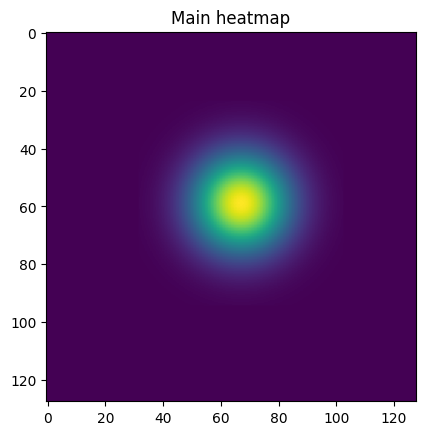

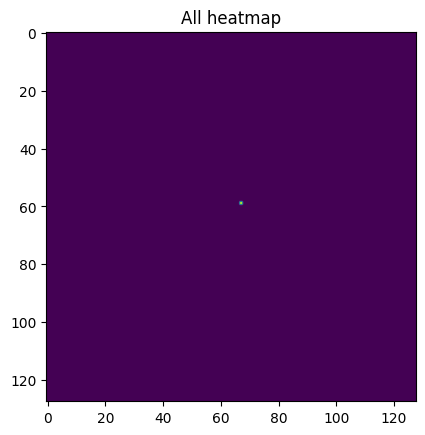

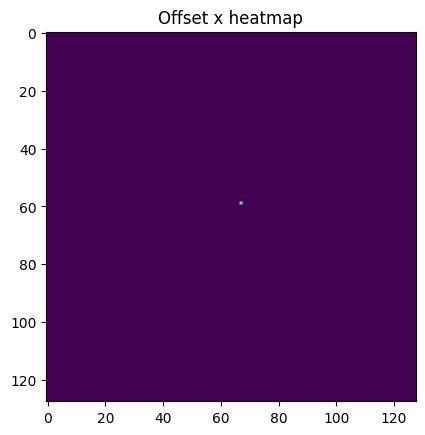

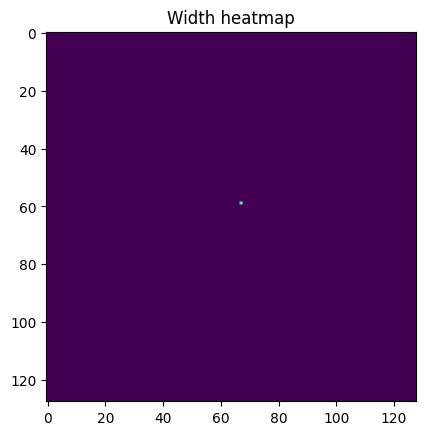

[[ 0.   0. ]
 [ 0.   0. ]
 [ 0.   0. ]
 [ 0.   0. ]
 [54.8 23. ]
 [ 0.   0. ]
 [ 0.   0. ]
 [ 0.   0. ]
 [ 0.   0. ]]
[[ 0.   0.   0.   0.  54.8  0.   0.   0.   0. ]
 [ 0.   0.   0.   0.  23.   0.   0.   0.   0. ]]
[264, 232]
[268, 232]
[272, 232]
[264, 236]
[271, 239]
[272, 236]
[264, 240]
[268, 240]
[272, 240]


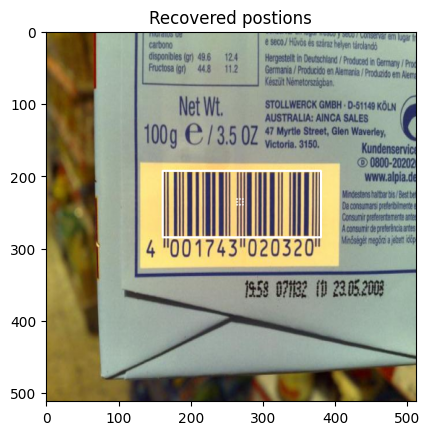

In [27]:
# Check traindataset

k = random.randint(0, len(train_id))
# Test dataset
img, hm, offset, regr,hm_all = traindataset[k]

plt.imshow(hm[0])
plt.title("Main heatmap")
plt.show()

plt.imshow(hm_all)
plt.title("All heatmap")
plt.show()

plt.imshow(offset[0])
plt.title("Offset x heatmap")
plt.show()

plt.imshow(regr[0])
plt.title("Width heatmap")
plt.show()

# plt.imshow(corners[0])
# plt.title("Corner heatmap")
# plt.show()

#print(cos_sin_hm.shape)

# plt.imshow(cos_sin_hm[0])
# plt.title("Cos heatmap")
# plt.show()

# plt.imshow(cos_sin_hm[1])
# plt.title("Sin heatmap")
# plt.show()

# Recover ball detection from heatmaps
img = cv2.imread(train_id[k])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(input_width,input_height))
img = showbox(img, hm[0], offset, regr, 0.99)

plt.imshow(img)
plt.title("Recovered postions")
plt.show()

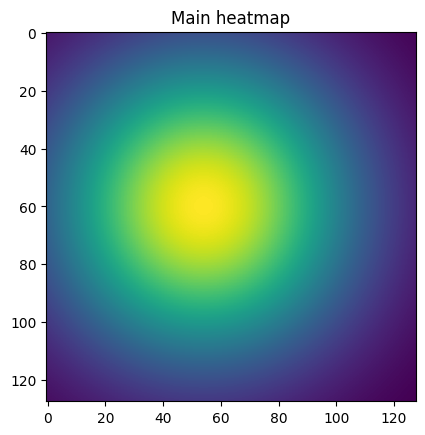

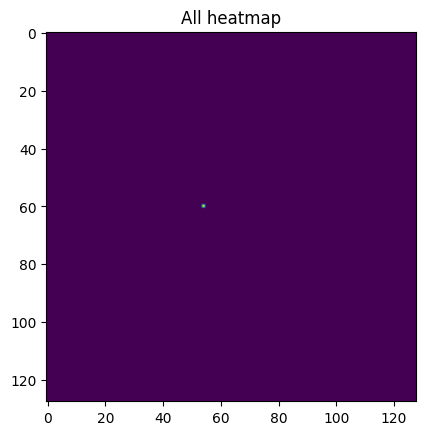

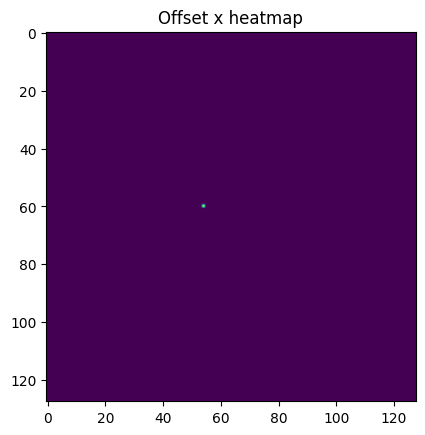

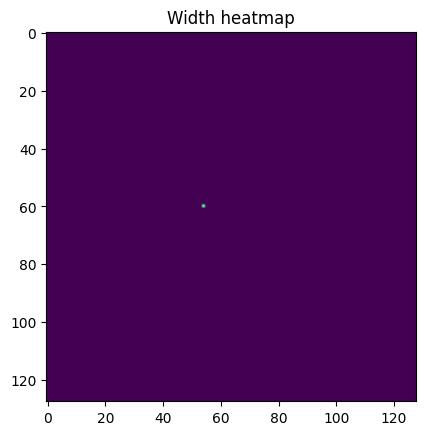

[[  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [ 98.8 103.4]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    0. ]
 [  0.    

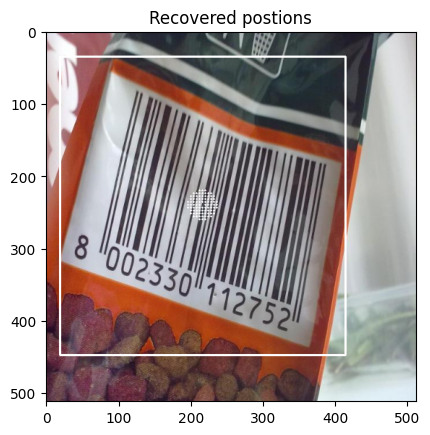

In [28]:
# Check traindataset
k = random.randint(0, len(val_id))
# Test dataset
img, hm, offset, regr,hm_all= valdataset[k]

plt.imshow(hm[0])
plt.title("Main heatmap")
plt.show()

plt.imshow(hm_all)
plt.title("All heatmap")
plt.show()

plt.imshow(offset[0])
plt.title("Offset x heatmap")
plt.show()

plt.imshow(regr[0])
plt.title("Width heatmap")
plt.show()

# plt.imshow(corners[0])
# plt.title("Corner heatmap")
# plt.show()

#print(cos_sin_hm.shape)

# plt.imshow(cos_sin_hm[0])
# plt.title("Cos heatmap")
# plt.show()

# plt.imshow(cos_sin_hm[1])
# plt.title("Sin heatmap")
# plt.show()

# Recover ball detection from heatmaps
img = cv2.imread(val_id[k])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img,(input_width,input_height))
img = showbox(img, hm[0], offset, regr, 0.99)

plt.imshow(img)
plt.title("Recovered postions")
plt.show()

(512, 512, 3)


C:\Users\John\anaconda3\envs\dl\lib\site-packages\torch\functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:3588.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


[[129.6   0.8 312.   57.6]
 [126.4 164.  317.6 366.4]
 [439.2   0.8 512.  343.2]]


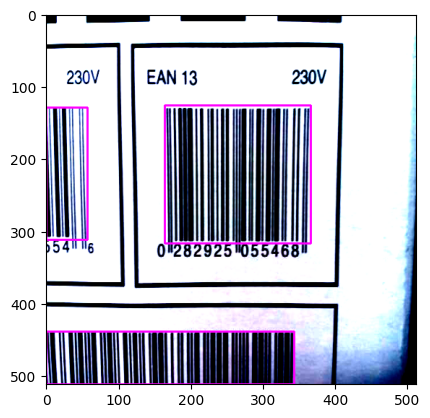

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)
[[236.8 116.  289.6 391.2]]


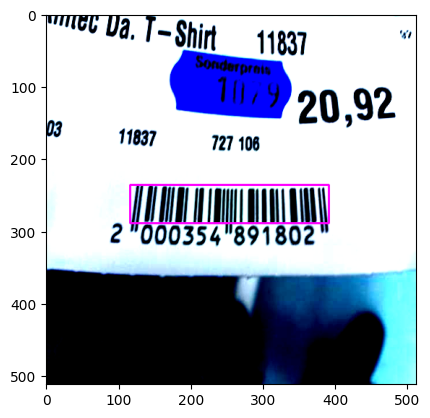

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)
[[156.8 167.2 297.6 335.2]]


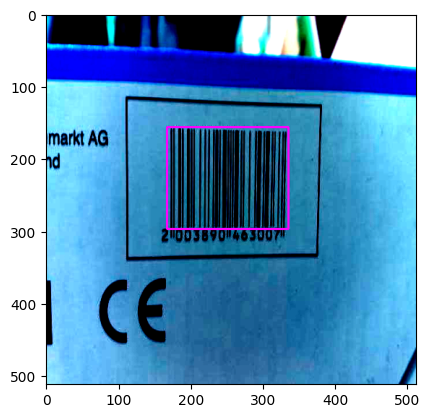

In [29]:
"""
Ground Truth of Validation

"""

for id in range(3):
    img, hm_gt, offset_gt, regr_gt,hm_all = valdataset[id]
    sample = np.transpose(img,(1,2,0)).copy()
    print(sample.shape)
    image_shape = np.array(np.shape(img)[0:2])
    img = torch.from_numpy(img)
    hm = torch.tensor(hm_gt)
    outputs = decode_bbox(hm[None].cuda(),torch.tensor(regr_gt[None]).cuda(),torch.tensor(offset_gt[None]).cuda())
    results = postprocess(outputs,True,[512, 512],image_shape, False, 0.3)
    try:
        top_label   = np.array(results[0][:, 5], dtype = 'int32')
        top_conf    = results[0][:, 4]
        top_boxes   = results[0][:, :4]
        print(top_boxes)
        for box in top_boxes:
            ymin = box[0]
            xmin = box[1]
            ymax = box[2]
            xmax = box[3]

            xmin = int(xmin)
            ymin = int(ymin)
            xmax = int(xmax)
            ymax = int(ymax)

            cv2.rectangle(sample,(xmin,ymin),(xmax,ymax),(255,0,255),2)
    except:
        pass
    plt.imshow(sample)
    plt.show()

In [30]:
train_loader = torch.utils.data.DataLoader(traindataset,batch_size=batch_size,shuffle=True)
val_loader = torch.utils.data.DataLoader(valdataset,batch_size=batch_size,shuffle=False)

## Define Centernet model

In [31]:
import torch.utils.model_zoo as model_zoo
from collections import OrderedDict
import math


__all__ = ['MobileNetV2']


model_urls = {
    'mobilenet_v2': 'https://download.pytorch.org/models/mobilenet_v2-b0353104.pth',
}


def _make_divisible(v, divisor, min_value=None):
    """
    This function is taken from the original tf repo.
    It ensures that all layers have a channel number that is divisible by 8
    It can be seen here:
    https://github.com/tensorflow/models/blob/master/research/slim/nets/mobilenet/mobilenet.py
    :param v:
    :param divisor:
    :param min_value:
    :return:
    """
    if min_value is None:
        min_value = divisor
    new_v = max(min_value, int(v + divisor / 2) // divisor * divisor)
    # Make sure that round down does not go down by more than 10%.
    if new_v < 0.9 * v:
        new_v += divisor
    return new_v

class ConvBNReLU(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size=3, stride=1, groups=1):
        padding = (kernel_size - 1) // 2
        super(ConvBNReLU, self).__init__(
            nn.Conv2d(in_planes, out_planes, kernel_size, stride, padding, groups=groups, bias=False),
            nn.BatchNorm2d(out_planes),
            nn.ReLU6(inplace=True)
        )


class InvertedResidual(nn.Module):
    def __init__(self, inp, oup, stride, expand_ratio):
        super(InvertedResidual, self).__init__()
        self.stride = stride
        assert stride in [1, 2]

        hidden_dim = int(round(inp * expand_ratio))
        self.use_res_connect = self.stride == 1 and inp == oup

        layers = []
        if expand_ratio != 1:
            # pw
            layers.append(ConvBNReLU(inp, hidden_dim, kernel_size=1))
        layers.extend([
            # dw
            ConvBNReLU(hidden_dim, hidden_dim, stride=stride, groups=hidden_dim),
            # pw-linear
            nn.Conv2d(hidden_dim, oup, 1, 1, 0, bias=False),
            nn.BatchNorm2d(oup),
        ])
        self.conv = nn.Sequential(*layers)

    def forward(self, x):
        if self.use_res_connect:
            return x + self.conv(x)
        else:
            return self.conv(x)


class MobileNetV2(nn.Module):
    def __init__(self,width_mult=1.0,round_nearest=8,):
        super(MobileNetV2, self).__init__()
        block = InvertedResidual
        input_channel = 32
        inverted_residual_setting = [
            # t, c, n, s
            [1, 16, 1, 1], # 0
            [6, 24, 2, 2], # 1
            [6, 32, 3, 2], # 2
            [6, 64, 4, 2], # 3
            [6, 96, 3, 1], # 4
            [6, 160, 3, 2],# 5
            [6, 320, 1, 1],# 6
        ]
        self.feat_id = [1,2,4,6]
        self.feat_channel = []

        # only check the first element, assuming user knows t,c,n,s are required
        if len(inverted_residual_setting) == 0 or len(inverted_residual_setting[0]) != 4:
            raise ValueError("inverted_residual_setting should be non-empty "
                             "or a 4-element list, got {}".format(inverted_residual_setting))

        # building first layer
        input_channel = _make_divisible(input_channel * width_mult, round_nearest)
        features = [ConvBNReLU(3, input_channel, stride=2)]

        # building inverted residual blocks
        for id,(t, c, n, s) in enumerate(inverted_residual_setting):
            output_channel = _make_divisible(c * width_mult, round_nearest)
            for i in range(n):
                stride = s if i == 0 else 1
                features.append(block(input_channel, output_channel, stride, expand_ratio=t))
                input_channel = output_channel
            if id in self.feat_id  :
                self.__setattr__("feature_%d"%id,nn.Sequential(*features))
                self.feat_channel.append(output_channel)
                features = []

        # weight initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)

    def forward(self, x):
        y = []
        for id in self.feat_id:
            x = self.__getattr__("feature_%d"%id)(x)
            y.append(x)
        return y

def load_model(model,state_dict):
    new_model=model.state_dict()
    new_keys = list(new_model.keys())
    old_keys = list(state_dict.keys())
    restore_dict = OrderedDict()
    for id in range(len(new_keys)):
        restore_dict[new_keys[id]] = state_dict[old_keys[id]]
    model.load_state_dict(restore_dict)






def fill_up_weights(up):
    w = up.weight.data
    f = math.ceil(w.size(2) / 2)
    c = (2 * f - 1 - f % 2) / (2. * f)
    for i in range(w.size(2)):
        for j in range(w.size(3)):
            w[0, 0, i, j] = \
                (1 - math.fabs(i / f - c)) * (1 - math.fabs(j / f - c))
    for c in range(1, w.size(0)):
        w[c, 0, :, :] = w[0, 0, :, :]

def fill_fc_weights(layers):
    for m in layers.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.normal_(m.weight, std=0.001)
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)


class IDAUp(nn.Module):
    def __init__(self, out_dim, channel):
        super(IDAUp, self).__init__()
        self.out_dim = out_dim
        self.up = nn.Sequential(
                    nn.ConvTranspose2d(
                        out_dim, out_dim, kernel_size=2, stride=2, padding=0,
                        output_padding=0, groups=out_dim, bias=False),
                    nn.BatchNorm2d(out_dim,eps=0.001,momentum=0.1),
                    nn.ReLU())
        self.conv =  nn.Sequential(
                    nn.Conv2d(channel, out_dim,
                              kernel_size=1, stride=1, bias=False),
                    nn.BatchNorm2d(out_dim,eps=0.001,momentum=0.1),
                    nn.ReLU(inplace=True))

    def forward(self, layers):
        layers = list(layers)
        x = self.up(layers[0])
        y = self.conv(layers[1])
        out = x + y
        return out

class MobileNetUp(nn.Module):
    def __init__(self, channels, out_dim = 24):
        super(MobileNetUp, self).__init__()
        channels =  channels[::-1]
        self.conv =  nn.Sequential(
                    nn.Conv2d(channels[0], out_dim,
                              kernel_size=1, stride=1, bias=False),
                    nn.BatchNorm2d(out_dim,eps=0.001,momentum=0.1),
                    nn.ReLU(inplace=True))
        self.conv_last =  nn.Sequential(
                    nn.Conv2d(out_dim,out_dim,
                              kernel_size=3, stride=1, padding=1 ,bias=False),
                    nn.BatchNorm2d(out_dim,eps=1e-5,momentum=0.01),
                    nn.ReLU(inplace=True))

        for i,channel in enumerate(channels[1:]):
            setattr(self,'up_%d'%(i),IDAUp(out_dim,channel))

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m,nn.ConvTranspose2d):
                fill_up_weights(m)

    def forward(self, layers):
        layers = list(layers)
        assert len(layers) > 1
        x = self.conv(layers[-1])
        for i in range(0,len(layers)-1):
            up = getattr(self, 'up_{}'.format(i))
            x = up([x,layers[len(layers)-2-i]])
        x = self.conv_last(x)
        return x

class MobileNetSeg(nn.Module):
    def __init__(self, base_name,heads,head_conv=24, pretrained = True):
        super(MobileNetSeg, self).__init__()
        self.heads = heads
        self.base = globals()[base_name](
            pretrained=pretrained)
        channels = self.base.feat_channel
        self.dla_up = MobileNetUp(channels, out_dim=head_conv)
        for head in self.heads:
            classes = self.heads[head]
            fc =nn.Conv2d(head_conv, classes,
                          kernel_size=1, stride=1,
                          padding=0, bias=True)
            if 'hm' in head:
                fc.bias.data.fill_(-2.19)
            else:
                nn.init.normal_(fc.weight, std=0.001)
                nn.init.constant_(fc.bias, 0)
            self.__setattr__(head, fc)

    def forward(self, x):
        x = self.base(x)
        x = self.dla_up(x)
        ret = {}
        for head in self.heads:
            ret[head] = self.__getattr__(head)(x)
        return ret["hm"],ret["wh"],ret["offset"] #[ret]


def mobilenetv2_10(pretrained=True, **kwargs):
    model = MobileNetV2(width_mult=1.0)
    if pretrained:
        state_dict = model_zoo.load_url(model_urls['mobilenet_v2'],
                                              progress=True)
        load_model(model,state_dict)
    return model

def mobilenetv2_5(pretrained=False, **kwargs):
    model = MobileNetV2(width_mult=0.5)
    if pretrained:
        print('This version does not have pretrain weights.')
    return model

# num_layers  : [10 , 5]
def get_mobile_net(num_layers, heads, head_conv=24):
  model = MobileNetSeg('mobilenetv2_{}'.format(num_layers), heads,
                 pretrained=True,
                 head_conv=head_conv)
  return model


# if __name__ == '__main__':
#     import torch
#     input = torch.zeros([1,3,416,416])
#     model = get_mobile_net(5,{'hm':20,'reg':2,'wh':2},head_conv=24)
#     model(input)

# Define Loss (Focal loss + L1-loss)

In [32]:
def focal_loss(pred_mask, gt,gamma=0.2):
    """
    Focal loss was introduced to address the class imbalance problem
    For example here, most of the pixels in the heatmap are negative.

    We split the focal loss between positive and negative losses.

    https://arxiv.org/pdf/1708.02002.pdf

    Code taken from the CenterNet repo.
    """
    gt = gt.unsqueeze(1).float()

    pos_inds = gt.eq(1).float()
    neg_inds = gt.lt(1).float()

    neg_weights = torch.pow(1 - gt, 4)

    #with torch.cuda.amp.autocast(enabled=False):
    # add 1e-12 to avoid nan values
    #pos_loss = - torch.pow(1 - pred_mask, gamma) * torch.log(pred_mask + 1e-12) * pos_inds # [2, 1, 128, 128]
    pos_loss = torch.log(pred_mask) * torch.pow(1 - pred_mask, 2) * pos_inds
    neg_loss = torch.log(1 - pred_mask) * torch.pow(pred_mask, 2) * neg_weights * neg_inds
    #neg_loss = - torch.pow(pred_mask, gamma) * torch.log(1 - pred_mask + 1e-12) * neg_inds * neg_weights # [2, 1, 128, 128]

    loss = 0

    num_pos  = pos_inds.float().sum() # scalar number of positives
    pos_loss = pos_loss.sum()
    neg_loss = neg_loss.sum()


    # if num_pos == 0:
    #     loss = neg_loss
    # else:
    #     pos_loss /= num_pos
    #     neg_loss /= num_pos
    #     loss = pos_loss + neg_loss

    if num_pos == 0:
        loss = -neg_loss
    else:
        loss = -(pos_loss + neg_loss) / num_pos

    assert not torch.isnan(pos_loss)
    assert not torch.isnan(neg_loss)

    return loss, pos_loss, neg_loss


def _regr_loss(off_pred, off_gt, wh_pred, wh_gt, hm_all):
    ''' L1 regression loss
    We compute l1 loss over mask of positive pixels for offset, width/height and sine/cosine angle
    '''
    #hm_gt = torch.sum(hm_gt,axis=1)

    mask = hm_all.unsqueeze(1).float()

    num = mask.float().sum()
    #mask_ = mask.expand_as(corner_gt).float()
    mask = mask.expand_as(off_gt).float()


    assert off_pred.size() == mask.size()
    off_pred = off_pred * mask
    off_gt = off_gt * mask
    wh_pred = wh_pred * mask
    wh_gt = wh_gt * mask
#     corner_pred = corner_pred * mask_
#     corner_gt = corner_gt * mask_
    # angle_pred = angle_pred * mask
    # angle_gt = angle_gt * mask

    off_loss = nn.functional.l1_loss(off_pred, off_gt, reduction='sum') / (num + 1e-4)

    # Scale with 0.1 width and height loss (change it you need)
    wh_loss = 0.1 * nn.functional.l1_loss(wh_pred, wh_gt, reduction='sum') / (num + 1e-4)

    #corner_loss =   0.1 * nn.functional.l1_loss(corner_pred, corner_gt, reduction='sum') / (num + 1e-4)

    return off_loss, wh_loss #, corner_loss

def global_loss(hm_pred, hm_gt, off_pred, off_gt, wh_pred, wh_gt,hm_all):
    """
    Global loss is the sum of the focal loss and of the offset loss

    Focal loss is the sum of pos_loss and neg_loss, we extract them just for the record
    """

    pred_mask = torch.clamp(torch.sigmoid(hm_pred), 1e-6, 1 - 1e-6)
    #print(pred_mask.shape)


    pred_mask = pred_mask.unsqueeze(1).float()
    #print(pred_mask.shape)

    foc_loss, pos_loss, neg_loss = focal_loss(pred_mask, hm_gt)

    off_loss, wh_loss = _regr_loss(off_pred, off_gt, wh_pred, wh_gt, hm_all)

    assert not torch.isnan(off_loss)

    return foc_loss, pos_loss, neg_loss, off_loss, wh_loss

basemodel = timm.create_model('convnext_nano', features_only=True, pretrained=True)

for i in basemodel(torch.rand(1,3,1280,720)):
    print(i.shape)
    print(i.size(2))

# Training

In [33]:
"""
hm = torch.tensor(hm_gt)
outputs = decode_bbox(hm[None].cuda(),torch.tensor(regr_gt[None]).cuda(),torch.tensor(offset_gt[None]).cuda())
results = postprocess(outputs,True,[512, 512],image_shape, False, 0.3)
top_label   = np.array(results[0][:, 5], dtype = 'int32')
top_conf    = results[0][:, 4]
top_boxes   = results[0][:, :4]
print(top_boxes)
for box in top_boxes:
    ymin = box[0]
    xmin = box[1]
    ymax = box[2]
    xmax = box[3]

    xmin = int(xmin)
    ymin = int(ymin)
    xmax = int(xmax)
    ymax = int(ymax)

    cv2.rectangle(sample,(xmin,ymin),(xmax,ymax),(255,0,255),2)



"""

"\nhm = torch.tensor(hm_gt)\noutputs = decode_bbox(hm[None].cuda(),torch.tensor(regr_gt[None]).cuda(),torch.tensor(offset_gt[None]).cuda())\nresults = postprocess(outputs,True,[512, 512],image_shape, False, 0.3)\ntop_label   = np.array(results[0][:, 5], dtype = 'int32')\ntop_conf    = results[0][:, 4]\ntop_boxes   = results[0][:, :4]\nprint(top_boxes)\nfor box in top_boxes:\n    ymin = box[0]\n    xmin = box[1]\n    ymax = box[2]\n    xmax = box[3]\n\n    xmin = int(xmin)\n    ymin = int(ymin)\n    xmax = int(xmax)\n    ymax = int(ymax)\n\n    cv2.rectangle(sample,(xmin,ymin),(xmax,ymax),(255,0,255),2)\n\n\n\n"

In [34]:
def pool_nms(heat, kernel = 3):
    pad = (kernel - 1) // 2

    hmax = nn.functional.max_pool2d(heat, (kernel, kernel), stride=1, padding=pad)
    keep = (hmax == heat).float()
    return heat * keep




def decode_bbox(pred_hms, pred_whs, pred_offsets, confidence=0.3, cuda=True):
    #-------------------------------------------------------------------------#
    #   当利用512x512x3图片进行coco数据集预测的时候
    #   h = w = 128 num_classes = 80
    #   Hot map热力图 -> b, 80, 128, 128,
    #   进行热力图的非极大抑制，利用3x3的卷积对热力图进行最大值筛选
    #   找出一定区域内，得分最大的特征点。
    #-------------------------------------------------------------------------#
    pred_hms = pool_nms(pred_hms)

    b, c, output_h, output_w = pred_hms.shape
    detects = []
    #-------------------------------------------------------------------------#
    #   只传入一张图片，循环只进行一次
    #-------------------------------------------------------------------------#
    for batch in range(b):
        #-------------------------------------------------------------------------#
        #   heat_map        128*128, num_classes    热力图
        #   pred_wh         128*128, 2              特征点的预测宽高
        #                                           在预测过程的前处理以及后处理视频中讲的有点小问题，不是调整参数，就是宽高
        #   pred_offset     128*128, 2              特征点的xy轴偏移情况
        #-------------------------------------------------------------------------#
        heat_map    = pred_hms[batch].permute(1, 2, 0).view([-1, c])
        pred_wh     = pred_whs[batch].permute(1, 2, 0).view([-1, 2])
        pred_offset = pred_offsets[batch].permute(1, 2, 0).view([-1, 2])

        yv, xv      = torch.meshgrid(torch.arange(0, output_h), torch.arange(0, output_w))
        #-------------------------------------------------------------------------#
        #   xv              128*128,    特征点的x轴坐标
        #   yv              128*128,    特征点的y轴坐标
        #-------------------------------------------------------------------------#
        xv, yv      = xv.flatten().float(), yv.flatten().float()
        if cuda:
            xv      = xv.cuda()
            yv      = yv.cuda()

        #-------------------------------------------------------------------------#
        #   class_conf      128*128,    特征点的种类置信度
        #   class_pred      128*128,    特征点的种类
        #-------------------------------------------------------------------------#
        class_conf, class_pred  = torch.max(heat_map, dim = -1)
        mask                    = class_conf > confidence

        #-----------------------------------------#
        #   取出得分筛选后对应的结果
        #-----------------------------------------#
        pred_wh_mask        = pred_wh[mask]
        pred_offset_mask    = pred_offset[mask]
        if len(pred_wh_mask) == 0:
            detects.append([])
            continue

        #----------------------------------------#
        #   计算调整后预测框的中心
        #----------------------------------------#
        xv_mask = torch.unsqueeze(xv[mask] + pred_offset_mask[..., 0], -1)
        yv_mask = torch.unsqueeze(yv[mask] + pred_offset_mask[..., 1], -1)
        #----------------------------------------#
        #   计算预测框的宽高
        #----------------------------------------#
        half_w, half_h = pred_wh_mask[..., 0:1] / 2, pred_wh_mask[..., 1:2] / 2
        #----------------------------------------#
        #   获得预测框的左上角和右下角
        #----------------------------------------#
        bboxes = torch.cat([xv_mask - half_w, yv_mask - half_h, xv_mask + half_w, yv_mask + half_h], dim=1)
        bboxes[:, [0, 2]] /= output_w
        bboxes[:, [1, 3]] /= output_h
        detect = torch.cat([bboxes, torch.unsqueeze(class_conf[mask],-1), torch.unsqueeze(class_pred[mask],-1).float()], dim=-1)
        detects.append(detect)

    return detects

def centernet_correct_boxes(box_xy, box_wh, input_shape, image_shape, letterbox_image):
    #-----------------------------------------------------------------#
    #   把y轴放前面是因为方便预测框和图像的宽高进行相乘
    #-----------------------------------------------------------------#
    box_yx = box_xy[..., ::-1]
    box_hw = box_wh[..., ::-1]
    input_shape = np.array(input_shape)
    image_shape = np.array(image_shape)

    if letterbox_image:
        #-----------------------------------------------------------------#
        #   这里求出来的offset是图像有效区域相对于图像左上角的偏移情况
        #   new_shape指的是宽高缩放情况
        #-----------------------------------------------------------------#
        new_shape = np.round(image_shape * np.min(input_shape/image_shape))
        offset  = (input_shape - new_shape)/2./input_shape
        scale   = input_shape/new_shape

        box_yx  = (box_yx - offset) * scale
        box_hw *= scale

    box_mins    = box_yx - (box_hw / 2.)
    box_maxes   = box_yx + (box_hw / 2.)
    boxes  = np.concatenate([box_mins[..., 0:1], box_mins[..., 1:2], box_maxes[..., 0:1], box_maxes[..., 1:2]], axis=-1)
    boxes *= np.concatenate([image_shape, image_shape], axis=-1)
    return boxes

def postprocess(prediction, need_nms, image_shape, input_shape, letterbox_image, nms_thres=0.4):
    output = [None for _ in range(len(prediction))]

    #----------------------------------------------------------#
    #   预测只用一张图片，只会进行一次
    #----------------------------------------------------------#
    for i, image_pred in enumerate(prediction):
        detections      = prediction[i]
        if len(detections) == 0:
            continue
        #------------------------------------------#
        #   获得预测结果中包含的所有种类
        #------------------------------------------#
        unique_labels   = detections[:, -1].cpu().unique()

        if detections.is_cuda:
            unique_labels = unique_labels.cuda()
            detections = detections.cuda()

        for c in unique_labels:
            #------------------------------------------#
            #   获得某一类得分筛选后全部的预测结果
            #------------------------------------------#
            detections_class = detections[detections[:, -1] == c]
            if need_nms:
                #------------------------------------------#
                #   使用官方自带的非极大抑制会速度更快一些！
                #------------------------------------------#
                keep = nms(
                    detections_class[:, :4],
                    detections_class[:, 4],
                    nms_thres
                )
                max_detections = detections_class[keep]

                # #------------------------------------------#
                # #   按照存在物体的置信度排序
                # #------------------------------------------#
                # _, conf_sort_index = torch.sort(detections_class[:, 4], descending=True)
                # detections_class = detections_class[conf_sort_index]
                # #------------------------------------------#
                # #   进行非极大抑制
                # #------------------------------------------#
                # max_detections = []
                # while detections_class.size(0):
                #     #---------------------------------------------------#
                #     #   取出这一类置信度最高的，一步一步往下判断。
                #     #   判断重合程度是否大于nms_thres，如果是则去除掉
                #     #---------------------------------------------------#
                #     max_detections.append(detections_class[0].unsqueeze(0))
                #     if len(detections_class) == 1:
                #         break
                #     ious = bbox_iou(max_detections[-1], detections_class[1:])
                #     detections_class = detections_class[1:][ious < nms_thres]
                # #------------------------------------------#
                # #   堆叠
                # #------------------------------------------#
                # max_detections = torch.cat(max_detections).data
            else:
                max_detections  = detections_class

            output[i] = max_detections if output[i] is None else torch.cat((output[i], max_detections))

        if output[i] is not None:
            output[i]           = output[i].cpu().numpy()
            box_xy, box_wh      = (output[i][:, 0:2] + output[i][:, 2:4])/2, output[i][:, 2:4] - output[i][:, 0:2]
            output[i][:, :4]    = centernet_correct_boxes(box_xy, box_wh, input_shape, image_shape, letterbox_image)
    return output

t = tqdm(train_loader)
device = "cuda"
for idx, (img, hm, offset, regr,hm_all) in enumerate(t):       
        # send to gpu
        img = img.to(device)
        hm_gt = hm.to(device)
        offset_gt = offset.to(device)
        wh_gt = regr.to(device)
        hm_all = hm_all.to(device)
        image_shape = [512,512]
        for t in range(len(img)):
            sample = img[t].cpu().permute(1,2,0).numpy().copy()
            hm = torch.tensor(hm_gt[t])
            #hm = torch.sigmoid(hm)
            outputs = decode_bbox(hm[None].cuda(),torch.tensor(wh_gt[t][None]).cuda(),torch.tensor(offset_gt[t][None]).cuda())
            results = postprocess(outputs,True,[512, 512],image_shape, False, 0.3)
            top_label   = np.array(results[0][:, 5], dtype = 'int32')
            top_conf    = results[0][:, 4]
            top_boxes   = results[0][:, :4]
            #print(top_boxes)
            for box in top_boxes:
                ymin = box[0]
                xmin = box[1]
                ymax = box[2]
                xmax = box[3]

                xmin = int(xmin)
                ymin = int(ymin)
                xmax = int(xmax)
                ymax = int(ymax)
                #print(xmin,ymin,xmax,ymax)
                cv2.rectangle(sample,(xmin,ymin),(xmax,ymax),(255,0,255),2)
            plt.imshow(sample)
            plt.show()
            #break

In [35]:
classes

['0']

In [36]:
def train(epoch):
    print(f'epochs {epoch+1}/{epochs}')
    print(f'Learning rate : {optimizer.param_groups[0]["lr"]}')
    train_loss = 0.0
    train_pos_loss = 0.0
    train_neg_loss = 0.0
    train_off_loss = 0.0
    train_wh_loss = 0.0
    #train_corner_loss = 0.0
    #train_angle_loss = 0.0
    t = tqdm(train_loader)
    rd = np.random.rand()

    # Training
    model.train()
    for idx, (img, hm, offset, regr,hm_all) in enumerate(t):
        set_optimizer_lr(optimizer, lr_scheduler_func, epoch)
        # send to gpu
        img = img.to(device)
        hm_gt = hm.to(device)
        offset_gt = offset.to(device)
        wh_gt = regr.to(device)
        hm_all = hm_all.to(device)
        #corner_gt = corner.to(device)
        #angle_gt = angle.to(device)
        # set opt
        optimizer.zero_grad()

        #n_iteration = (iterations_per_epoch * epoch) + idx
        #print("N_iteration:" ,n_iteration)
        # run model
        #with torch.autocast(device_type=device, dtype=torch.float16, enabled=use_amp):
        #with torch.cuda.amp.autocast(enabled=True):
        preds_hm, preds_offset, preds_wh = model(img)
        assert not np.isnan(preds_hm.cpu().detach().numpy()[0, 0, 0, 0])

        foc_loss, pos_loss, neg_loss, off_loss, wh_loss = global_loss(preds_hm, hm_gt, preds_offset, offset_gt, preds_wh, wh_gt,hm_all)

        loss = foc_loss + off_loss + wh_loss
        #loss = loss / batch_size

        if torch.isnan(loss):
            print("NAN loss")
            continue

        # misc
        train_loss += float(loss) # TRICK to avoid GPU memory increasing
        train_pos_loss += float(pos_loss)
        train_neg_loss += float(neg_loss)
        train_off_loss += float(off_loss)
        train_wh_loss += float(wh_loss)
        #train_corner_loss += float(corner_loss)
        if (use_amp == False):
            loss.backward()
            # NB: I tried to use gradient clipping to avoid NaN values but it didnt work as expected
            optimizer.step()

        if (use_amp):

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)

        total_norm = torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0, norm_type=2)  # grad clip helps in both amp and fp32
        # if torch.logical_or(total_norm.isnan(), total_norm.isinf()):
        #     # scaler is going to skip optimizer.step() if grads are nan or inf
        #     # some updates are skipped anyway in the amp mode, but we can count for statistics
        #     skipped_updates += 1

        if (use_amp):

            scaler.step(optimizer)
            scaler.update()

            if scaler._scale < min_scale:
                scaler._scale = torch.tensor(min_scale).to(scaler._scale)

        #optimizer.zero_grad()
        # scaler.step(optimizer)
        # scaler.update()
        # optimizer.zero_grad() # set_to_none=True here can modestly improve performance

        # if (n_iteration + 1) % iters_to_accumulate == 0:
        #     scaler.step(optimizer)
        #     scaler.update()
        #     optimizer.zero_grad()



        # if n_iteration > warmup_iteration:
        #     scheduler.step()
        # else:
        #     lr = initial_lr * float(n_iteration) / warmup_iteration
        #     for param_group in optimizer.param_groups:
        #         param_group['lr'] = lr

        # if scaler._scale < 128: #min_scale = 128 #https://github.com/pytorch/pytorch/issues/40497#issuecomment-1671378473
        #     scaler._scale = torch.tensor(128).to(scaler._scale)




        t.set_description(f'(l={train_loss/(idx+1):.2f}) (off={train_off_loss/(idx+1):.3f}) (wh={train_wh_loss/(idx+1):.3f})')

    # Validation
    val_loss = 0.0
    val_pos_loss = 0.0
    val_neg_loss = 0.0
    val_off_loss = 0.0
    val_wh_loss = 0.0
    #val_corner_loss = 0.0

    model.eval()

    with torch.no_grad():
        for idx, (img, hm, offset, regr,hm_all) in enumerate(tqdm(val_loader)):
            # send to gpu
            img = img.to(device)
            hm_gt = hm.to(device)
            offset_gt = offset.to(device)
            wh_gt = regr.to(device)
            hm_all = hm_all.to(device)
            #corner_gt = corner.to(device)
            #angle_gt = angle.to(device)

            # run model
            #with torch.autocast(device_type=device, dtype=torch.float16, enabled=use_amp):
            preds_hm, preds_offset, preds_wh = model(img)

            foc_loss, pos_loss, neg_loss, off_loss, wh_loss = global_loss(preds_hm, hm_gt, preds_offset, offset_gt, preds_wh, wh_gt,hm_all)

            loss = foc_loss + off_loss + wh_loss
            #loss = loss / batch_size



            # misc
            val_loss += float(loss)
            val_pos_loss += float(pos_loss)
            val_neg_loss += float(neg_loss)
            val_off_loss += float(off_loss)
            val_wh_loss += float(wh_loss)
            #val_corner_loss += float(corner_loss)

    #mAP = metric_fn.value(iou_thresholds=np.arange(0.5, 1.0, 0.05), recall_thresholds=np.arange(0., 1.01, 0.01), mpolicy='soft')['mAP'] #metric_fn.value(iou_thresholds=0.5)['mAP']
    # mAP = metric_fn.value(iou_thresholds=0.5)['mAP']

    # print(f"Pascal VOC mAP in all points: {mAP}")

    # if (epoch) % 1 == 0:
    #     calc_det(model)
    #     f = !python /home/rivian/Desktop/mAP/main.py --no-animation
    #     mAP_general = float(f[-2].split('=')[-1].split('%')[0].split()[0])
    #     print("GENERAL MAP:",mAP_general)

    calc_det(model)
    cocoDt = cocoGt.loadRes("detection_results.json")
    cocoEval = COCOeval(cocoGt, cocoDt, 'bbox')
    cocoEval.evaluate()
    cocoEval.accumulate()
    cocoEval.summarize()

    mean_ap = cocoEval.stats[0]  # This is the mAP at IoU thresholds from .50 to .95
    mean_ap_05 = cocoEval.stats[1]
    mean_ap_075 = cocoEval.stats[2]

    print(f"Mean Average Precision (mAP) across IoU thresholds [0.50, 0.95]: {mean_ap:.3f}")

    print(f'train loss : {train_loss/len(train_loader):.4f}')
    print(f'Pos loss : {train_pos_loss/len(train_loader):.4f}')
    print(f'Neg loss : {train_neg_loss/len(train_loader):.4f}')
    print(f'Off loss : {train_off_loss/len(train_loader):.4f}')
    print(f'Wh loss : {train_wh_loss/len(train_loader):.4f}')
    #print(f'Corner loss : {train_corner_loss/len(train_loader):.4f}')

    print("")
    print(f'Val loss : {val_loss/len(val_loader):.4f}')
    print(f'Val Pos loss : {val_pos_loss/len(val_loader):.4f}')
    print(f'Val Neg loss : {val_neg_loss/len(val_loader):.4f}')
    print(f'Val Off loss : {val_off_loss/len(val_loader):.4f}')
    print(f'Val Wh loss : {val_wh_loss/len(val_loader):.4f}')
    #print(f'Val Corner loss : {val_corner_loss/len(val_loader):.4f}')

    # save logs
    log_epoch = {'epoch': epoch+1, 'lr': optimizer.state_dict()['param_groups'][0]['lr'],
                'train_loss': train_loss/len(train_loader), 'train_pos_loss': train_pos_loss/len(train_loader),
                'train_neg_loss': train_neg_loss/len(train_loader), 'train_off_loss': train_off_loss/len(train_loader),
                'val_loss': val_loss/len(val_loader), 'val_pos_loss': val_pos_loss/len(val_loader),
                'val_neg_loss': val_neg_loss/len(val_loader), 'val_off_loss': val_off_loss/len(val_loader)
                 }
    logs.append(log_epoch)

    return val_loss/len(val_loader),[mean_ap,mean_ap_05,mean_ap_075]

cocoDt = cocoGt.loadRes("detection_results.json")

# Check the number of images and annotations
print(f"Number of images in ground truth: {len(cocoGt.imgs)}")
print(f"Number of annotations in ground truth: {len(cocoGt.anns)}")
print(f"Number of detections: {len(cocoDt.anns)}")

# Display a few examples
print("Some ground truth annotations:")
for ann_id, ann in list(cocoGt.anns.items())[:5]:
    print(ann)

print("Some detection results:")
for ann_id, ann in list(cocoDt.anns.items())[:5]:
    print(ann)

In [37]:
def get_lr_scheduler(lr_decay_type, lr, min_lr, total_iters, warmup_iters_ratio = 0.05, warmup_lr_ratio = 0.1, no_aug_iter_ratio = 0.05, step_num = 10):
    def yolox_warm_cos_lr(lr, min_lr, total_iters, warmup_total_iters, warmup_lr_start, no_aug_iter, iters):
        if iters <= warmup_total_iters:
            # lr = (lr - warmup_lr_start) * iters / float(warmup_total_iters) + warmup_lr_start
            lr = (lr - warmup_lr_start) * pow(iters / float(warmup_total_iters), 2) + warmup_lr_start
        elif iters >= total_iters - no_aug_iter:
            lr = min_lr
        else:
            lr = min_lr + 0.5 * (lr - min_lr) * (
                1.0 + math.cos(math.pi* (iters - warmup_total_iters) / (total_iters - warmup_total_iters - no_aug_iter))
            )
        return lr

    def step_lr(lr, decay_rate, step_size, iters):
        if step_size < 1:
            raise ValueError("step_size must above 1.")
        n       = iters // step_size
        out_lr  = lr * decay_rate ** n
        return out_lr

    if lr_decay_type == "cos":
        warmup_total_iters  = min(max(warmup_iters_ratio * total_iters, 1), 3)
        warmup_lr_start     = max(warmup_lr_ratio * lr, 1e-6)
        no_aug_iter         = min(max(no_aug_iter_ratio * total_iters, 1), 15)
        func = partial(yolox_warm_cos_lr ,lr, min_lr, total_iters, warmup_total_iters, warmup_lr_start, no_aug_iter)
    else:
        decay_rate  = (min_lr / lr) ** (1 / (step_num - 1))
        step_size   = total_iters / step_num
        func = partial(step_lr, lr, decay_rate, step_size)

    return func

def set_optimizer_lr(optimizer, lr_scheduler_func, epoch):
    lr = lr_scheduler_func(epoch)
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

In [38]:
#model = CenterNet_Resnet50(len(classes), pretrained = True)
#model = resnet_18()
#model = get_pose_net(85,{"hm":len(classes),"offset":2,"wh":2})
model = get_mobile_net(5,{'hm':len(classes),'offset':2,'wh':2},head_conv=24)
#model = resnet_34()
#model = CenterNet_Resnet50(len(classes), pretrained = True)
name = "mobilenet"
#model.load_state_dict(torch.load("centernet-oriented-bbox.pth"))
#model.load_state_dict(torch.load(f"rn50-{name}.pth"))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
# Optimizer
#optimizer = optim.Adam(model.parameters(), lr=0.01,weight_decay=0.0001)
epochs = 100 #15 * 6 * 2
#optimizer = torch.optim.Adam(model.parameters(), lr=initial_lr)

optimizer_type = "adam"
momentum            = 0.9
weight_decay        = 0
nbs             = 64
Init_lr             = 5e-4
Min_lr              = Init_lr * 0.01
lr_limit_max    = 5e-4 if optimizer_type == 'adam' else 5e-2
lr_limit_min    = 2.5e-4 if optimizer_type == 'adam' else 5e-4
Init_lr_fit     = min(max(batch_size / nbs * Init_lr, lr_limit_min), lr_limit_max)
Min_lr_fit      = min(max(batch_size / nbs * Min_lr, lr_limit_min * 1e-2), lr_limit_max * 1e-2)
lr_decay_type       = 'cos'
optimizer = optim.Adam(model.parameters(), Init_lr_fit, betas = (momentum, 0.999), weight_decay = weight_decay)


lr_scheduler_func = get_lr_scheduler(lr_decay_type, Init_lr_fit, Min_lr_fit, epochs)
#----------------------------------------
# iters_to_accumulate = max(round(32/32), 1)
# initial_lr = 5e-4 * (32/128)

# for param_group in optimizer.param_groups:
#     param_group['lr'] = 0.

# iterations_per_epoch = len(train_loader)
# total_iteration =  iterations_per_epoch * epochs
# scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=total_iteration)

# warmup_iteration = 1000
#----------------------------------------

scaler = torch.cuda.amp.GradScaler(growth_interval=100)
min_scale = 128
logs = []
best_loss = float('inf')
best_mean_AP = 0

This version does not have pretrain weights.


In [39]:
img, hm, offset, regr,hm_all = next(iter(train_loader))

In [40]:
#import thop
# flops, params   = thop.profile(model, (img.cuda(),), verbose=False)
# flops = flops * 2
# flops, params   = thop.clever_format([flops, params], "%.3f")
# print('Total GFLOPS: %s' % (flops))
# print('Total params: %s' % (params))

In [41]:
hm.shape

torch.Size([4, 1, 128, 128])

In [42]:
img.shape

torch.Size([4, 3, 512, 512])

In [43]:
use_amp = False
device = 'cuda'
for epoch in range(epochs):
    val_los,APs = train(epoch)
    mean_ap = APs[0] # cocoEval.stats[0] is AP at IoU=.50:0.95, area=all, maxDets=100
    mean_ap_05 = APs[1] # cocoEval.stats[1] is AP at IoU=.50, area=all, maxDets=100
    mean_ap_075 = APs[2] # cocoEval.stats[1] is AP at IoU=.75, area=all, maxDets=100
    torch.save(model.state_dict(), f"pretrained-raf-{name}_last.pth")
    if mean_ap > best_mean_AP:
        best_mean_AP = mean_ap
        print(f"Improved validation mAP to {best_mean_AP:.3f}")
        torch.save(model.state_dict(), f"pretrained-raf-{name}.pth")

epochs 1/100
Learning rate : 0.00025


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:17<00:00, 21.96it/s]


Loading and preparing results...
DONE (t=3.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.86s).
Accumulating evaluation results...
DONE (t=0.18s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:16<00:00, 22.96it/s]


Loading and preparing results...
DONE (t=3.07s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.84s).
Accumulating evaluation results...
DONE (t=0.18s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:17<00:00, 22.36it/s]


Loading and preparing results...
DONE (t=2.80s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.82s).
Accumulating evaluation results...
DONE (t=0.18s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:16<00:00, 23.12it/s]


Loading and preparing results...
DONE (t=2.79s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.85s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:15<00:00, 24.15it/s]


Loading and preparing results...
DONE (t=2.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.64s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 25.69it/s]


Loading and preparing results...
DONE (t=1.44s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.49s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.20it/s]


Loading and preparing results...
DONE (t=0.99s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.33s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.034
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.110
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.019
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.034
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.069
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.069
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.069
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 26.23it/s]


Loading and preparing results...
DONE (t=0.69s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.27s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.058
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.058
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.110
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.111
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.111
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 26.13it/s]


Loading and preparing results...
DONE (t=0.63s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.22s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.102
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.353
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.024
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.102
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.181
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.186
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.186
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 270/382 [00:10<00:04, 25.61it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 366/382 [00:13<00:00, 28.92it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 26.42it/s]


Loading and preparing results...
DONE (t=0.45s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.14s).
Accumulating evaluation results...
DONE (t=0.19s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.151
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.440
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.059
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.151
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.215
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.221
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.221
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 270/382 [00:09<00:04, 27.60it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 365/382 [00:12<00:00, 28.29it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.34it/s]


Loading and preparing results...
DONE (t=0.29s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.17s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.113
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.417
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.023
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.114
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.209
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.226
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.226
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.05it/s]


Loading and preparing results...
DONE (t=0.29s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.99s).
Accumulating evaluation results...
DONE (t=0.17s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.163
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.511
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.064
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.164
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.245
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.249
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.249
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.97it/s]


Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.68s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.191
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.529
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.081
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.191
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.298
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.302
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.302
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 263/382 [00:09<00:04, 27.94it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 284/382 [00:10<00:03, 25.31it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 26.57it/s]


Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.62s).
Accumulating evaluation results...
DONE (t=0.11s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.222
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.625
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.112
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.223
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.312
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 364/382 [00:13<00:00, 29.05it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 26.91it/s]


Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.54s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.600
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.075
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.202
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.291
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.295
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.295
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 363/382 [00:12<00:00, 29.47it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.95it/s]


Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.52s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.597
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.067
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.202
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.302
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.304
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.304
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 364/382 [00:13<00:00, 26.94it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 26.53it/s]


Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.56s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.214
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.620
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.068
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.215
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 261/382 [00:09<00:04, 26.49it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 363/382 [00:14<00:00, 22.76it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 25.60it/s]


Loading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.41s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.289
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.744
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.139
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.290
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.378
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.17it/s]


Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.39s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.604
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.075
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.202
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.334
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 365/382 [00:13<00:00, 29.06it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.73it/s]


Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.32s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.246
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.704
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.090
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.247
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.77it/s]


Loading and preparing results...
DONE (t=0.11s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.32s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.727
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.090
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.241
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.332
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.332
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.72it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.26s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.276
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.729
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.124
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.277
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.376
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.382
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.382
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.73it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.24s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.786
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.130
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.301
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.390
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.390
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 364/382 [00:12<00:00, 28.76it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.37it/s]


Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.30s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.761
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.159
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.295
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.98it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.25s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.291
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.745
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.154
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.292
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.384
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.389
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.389
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 363/382 [00:12<00:00, 29.50it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.22it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.24s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.290
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.738
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.164
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.291
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.392
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 262/382 [00:09<00:04, 27.96it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.14it/s]


Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.20s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.748
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.153
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.302
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.397
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.401
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.401
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 264/382 [00:09<00:04, 27.09it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.00it/s]


Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.20s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.294
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.741
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.158
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.295
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.396
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 362/382 [00:13<00:00, 27.87it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.56it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.18s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.757
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.189
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.313
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.402
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.405
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.33it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.21s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.789
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.165
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.396
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.396
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 262/382 [00:09<00:04, 27.07it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 365/382 [00:13<00:00, 28.62it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.99it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.24s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.326
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.793
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.194
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.412
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 263/382 [00:09<00:04, 28.83it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.20it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.20s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.338
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.805
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.205
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.437
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.444
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.444
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 261/382 [00:09<00:04, 25.95it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 364/382 [00:13<00:00, 28.56it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.70it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.18s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.333
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.802
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.190
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.441
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.445
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.445
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.45it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.17s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.309
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.774
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.159
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.309
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.402
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.410
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.410
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 263/382 [00:09<00:04, 25.70it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 26.38it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.17s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.292
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.781
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.139
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.294
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.401
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.414
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 27.16it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.26s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.834
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.169
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.427
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.429
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.429
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 264/382 [00:09<00:04, 29.32it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.77it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.820
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.177
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.438
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.440
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.440
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.53it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.343
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.804
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.210
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.438
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.443
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.443
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.41it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.17s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.763
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.148
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.307
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.411
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 262/382 [00:09<00:04, 29.55it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.73it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.808
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.174
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.320
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.425
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.431
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.431
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.53it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.350
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.835
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.207
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.433
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.438
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.438
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.87it/s]


Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.355
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.828
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.221
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.356
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.451
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.456
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.456
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 264/382 [00:09<00:04, 29.31it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.34it/s]


Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.350
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.808
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.260
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.445
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.450
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.450
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 27.03it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.316
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.787
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.185
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.429
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.434
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.434
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 366/382 [00:11<00:00, 31.38it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:12<00:00, 30.61it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.336
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.826
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.221
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.436
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.440
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.440
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.02it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.355
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.826
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.215
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.441
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.445
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.445
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.34it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.343
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.798
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.444
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.448
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.448
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.41it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.366
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.816
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.286
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.448
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.457
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.457
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.03it/s]


Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.18s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.335
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.803
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.425
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.432
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.432
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                 | 264/382 [00:09<00:03, 30.20it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 362/382 [00:12<00:00, 28.19it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.81it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.347
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.827
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.221
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.447
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.453
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.453
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.76it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.360
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.827
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.455
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.463
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.463
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 262/382 [00:09<00:04, 27.90it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 27.16it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.362
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.810
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.273
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.466
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.469
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.469
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 27.12it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.337
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.811
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.443
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.447
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.447
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.25it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.370
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.841
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.255
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.464
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.472
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.472
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.00it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.359
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.847
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.252
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.451
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.454
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.454
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 27.73it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.22s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.356
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.844
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.226
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.357
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.451
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.455
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.455
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                               | 268/382 [00:09<00:04, 27.74it/s]

Could not infer an error occured: 'NoneType' object is not subscriptable


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.85it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.334
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.789
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.463
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.467
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.467
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.26it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.13s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.366
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.810
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.280
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.476
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.481
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.481
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:14<00:00, 27.26it/s]


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.353
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.825
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.259
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.455
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.458
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.458
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 382/382 [00:13<00:00, 28.22it/s]


Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.370
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.837
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.263
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.476
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.480
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.480
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

(l=1.59) (off=0.435) (wh=1.061):  19%|████████████████████████▉                                                                                                       | 37/190 [00:03<00:15,  9.63it/s]


KeyboardInterrupt: 

In [ ]:
mean_ap,mean_ap_05,mean_ap_075,APs

In [ ]:
#torch.save(model.state_dict(), f"centernet-barcode-{name}_last.pth")

In [ ]:
bitiş

In [ ]:
loss_iter = [log["train_loss"] for log in logs]
val_loss_iter = [log["val_loss"] for log in logs]
plt.plot(loss_iter[1:], label="Train")
plt.plot(val_loss_iter[1:], label="Val")
plt.xlabel("Iterations")
plt.ylabel("Train loss")
plt.title("Train loss")
plt.legend()
plt.show()

pos_loss_iter = [log["train_pos_loss"] for log in logs]
val_pos_loss_iter = [log["val_pos_loss"] for log in logs]
plt.plot(pos_loss_iter[1:], label="Train")
plt.plot(val_pos_loss_iter[1:], label="Val")
plt.xlabel("Iterations")
plt.ylabel("Positive loss")
plt.title("Positive loss")
plt.legend()
plt.show()

neg_loss_iter = [log["train_neg_loss"] for log in logs]
val_neg_loss_iter = [log["val_neg_loss"] for log in logs]
plt.plot(neg_loss_iter[1:], label="Train")
plt.plot(val_neg_loss_iter[1:], label="Val")
plt.xlabel("Iterations")
plt.ylabel("Negative loss")
plt.title("Negative loss")
plt.legend()
plt.show()

off_loss_iter = [log["train_off_loss"] for log in logs]
val_off_loss_iter = [log["val_off_loss"] for log in logs]
plt.plot(off_loss_iter[1:], label="Train")
plt.plot(val_off_loss_iter[1:], label="Val")
plt.xlabel("Iterations")
plt.ylabel("Offset loss")
plt.title("Offset loss")
plt.legend()
plt.show()

In [ ]:
classes

In [ ]:
best_loss

# Show predictions

traced_model = torch.jit.trace(model, [img[None].cuda()])

torch.jit.save(traced_model, f"traced_centernet-barcode-{name}.pt")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


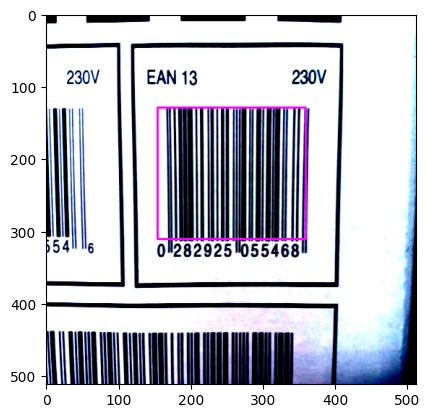

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


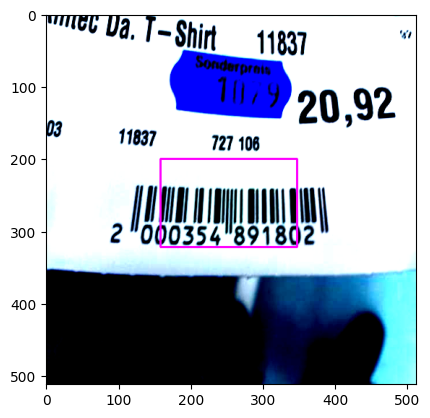

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


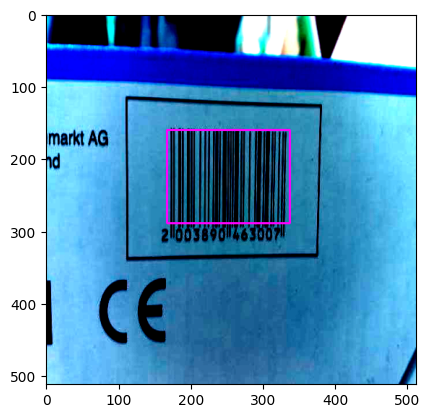

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


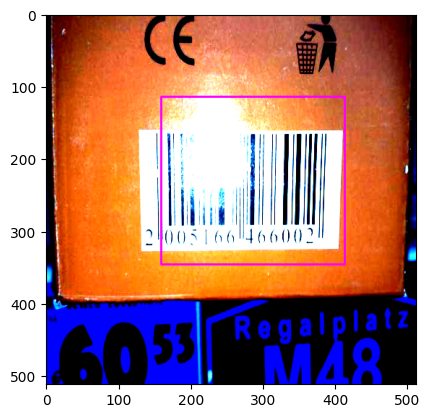

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831933..255.0].


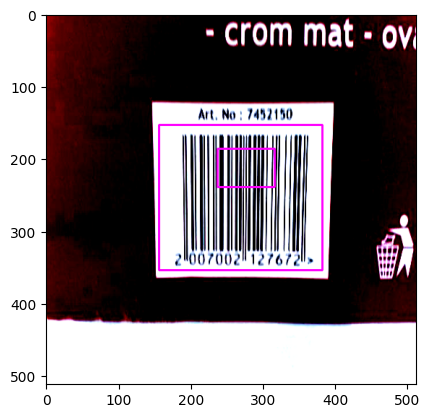

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6155462..255.0].


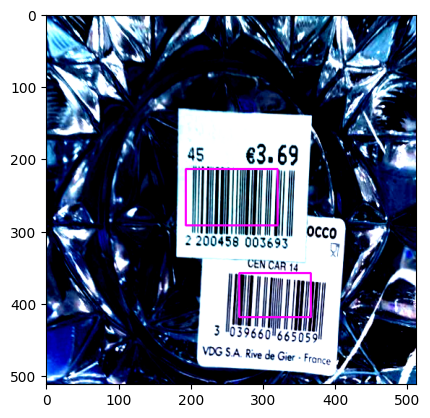

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


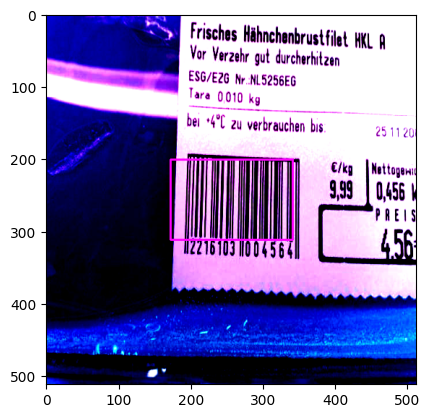

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


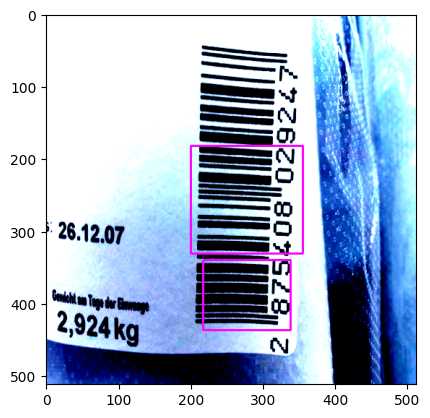

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


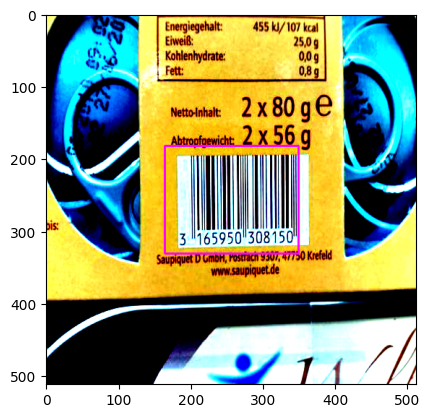

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


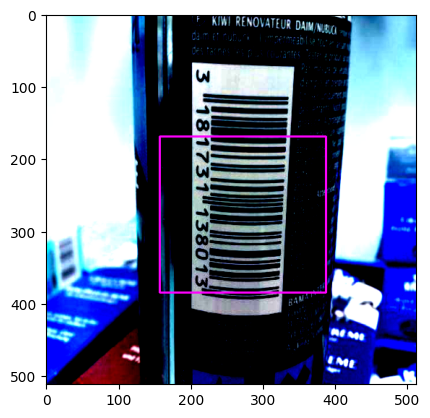

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


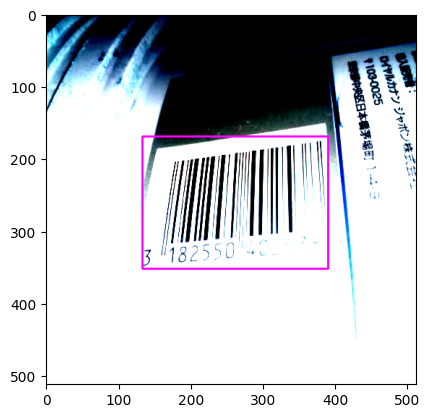

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357144..255.0].


(512, 512, 3)


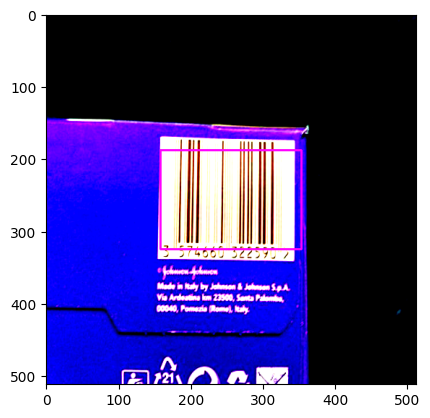

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


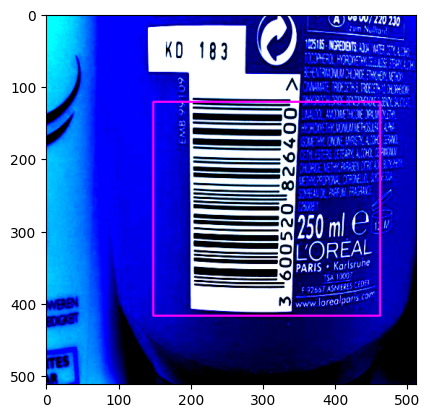

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


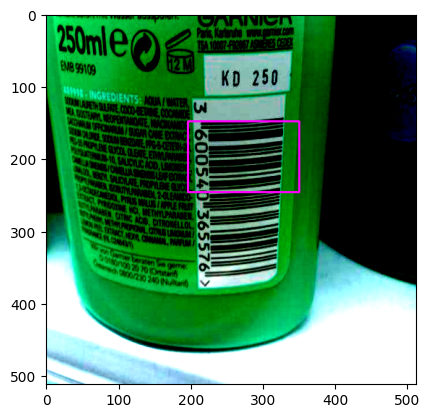

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


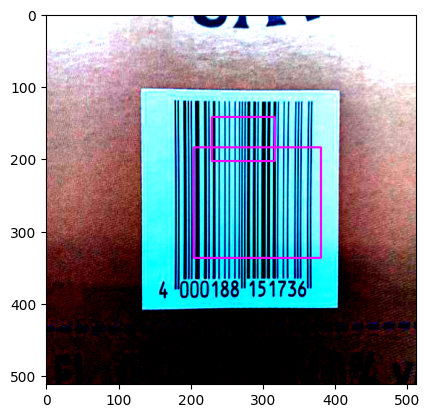

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7925335..255.0].


(512, 512, 3)


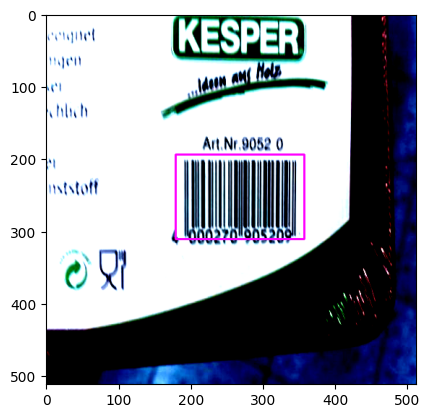

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


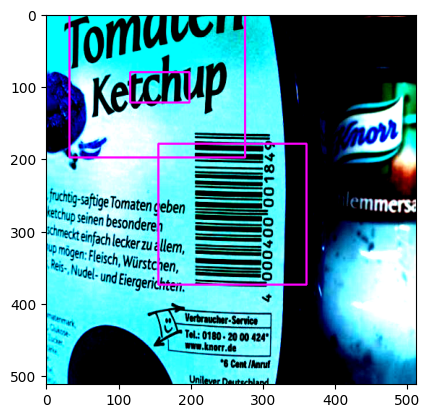

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..255.0].


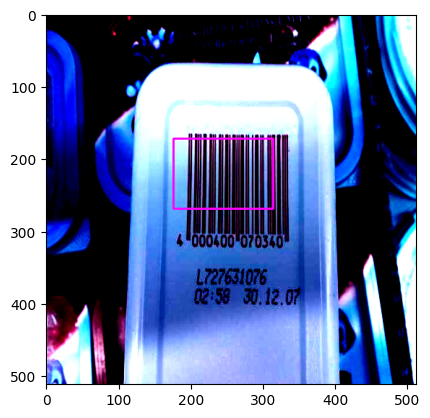

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


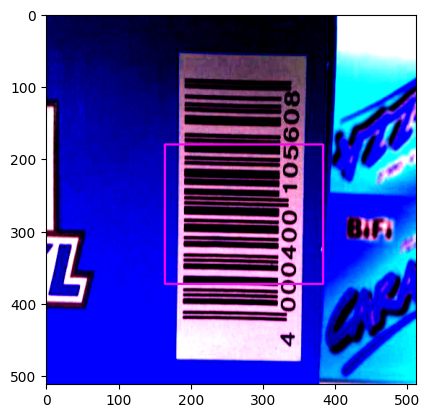

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


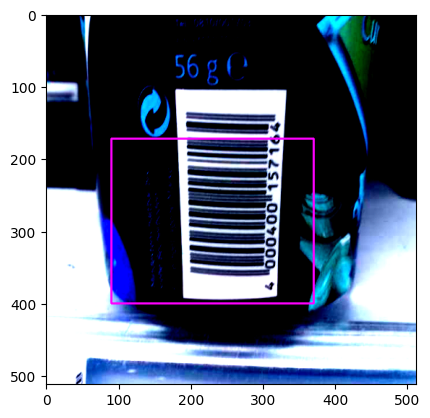

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


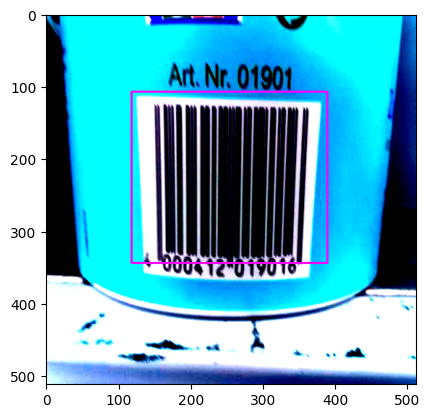

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


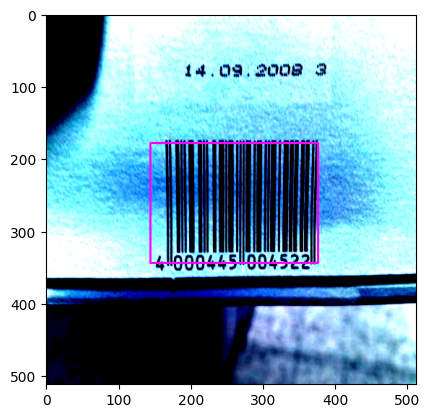

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


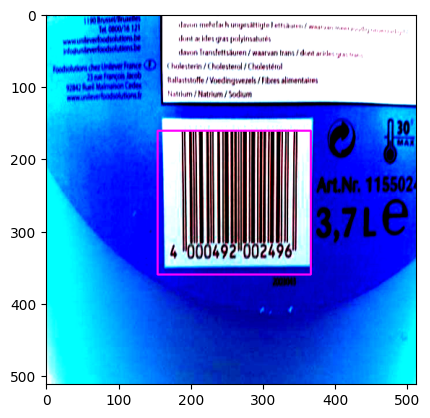

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


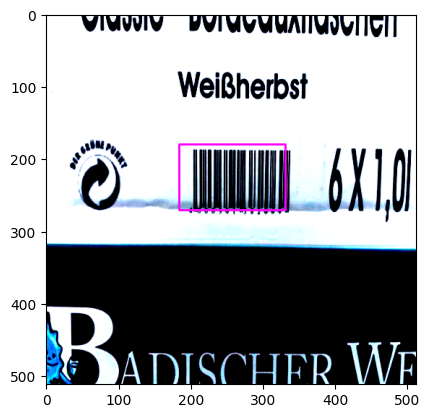

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


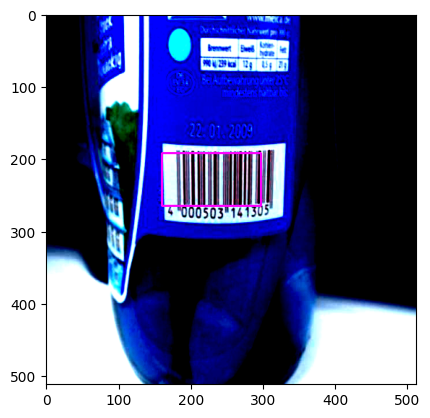

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..255.0].


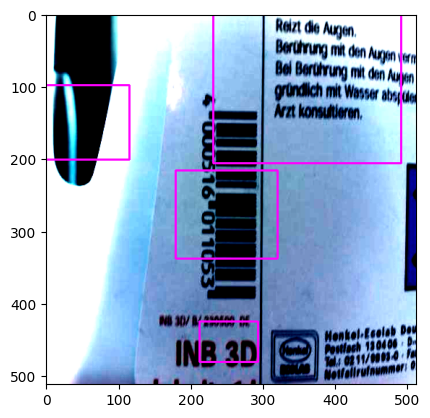

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


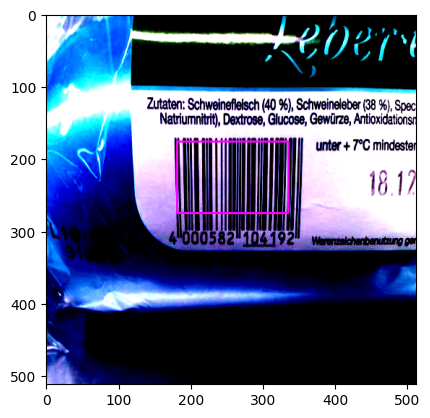

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


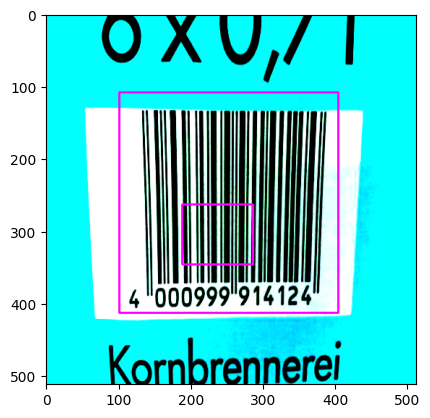

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


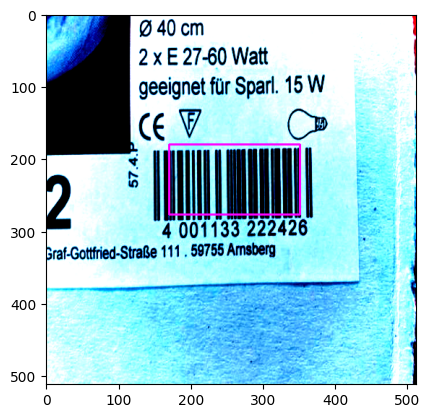

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


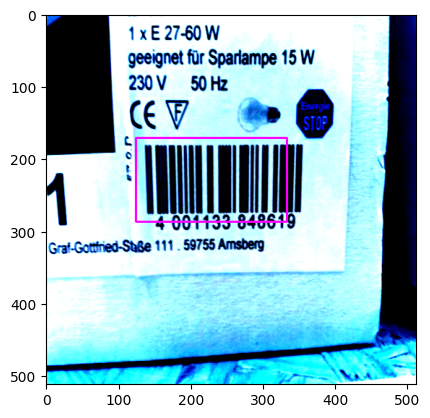

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


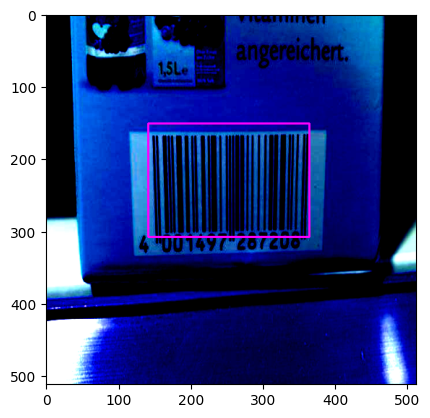

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


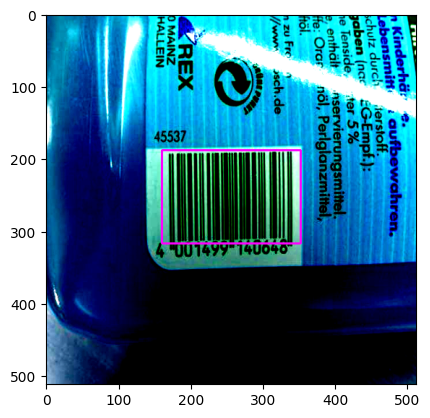

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


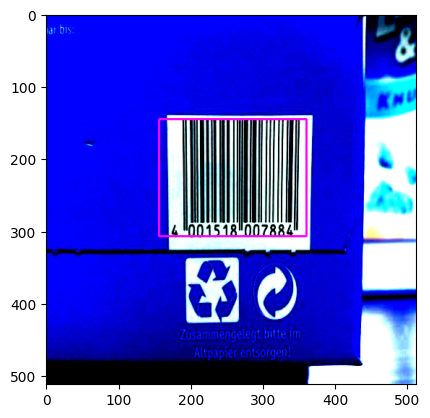

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


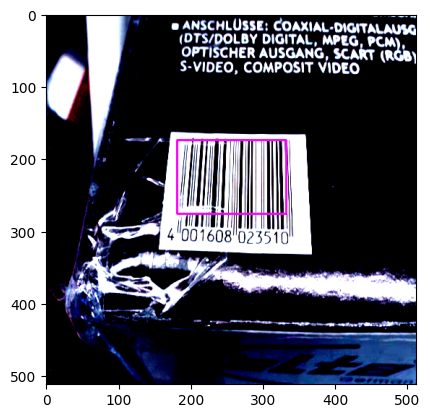

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665295..255.0].


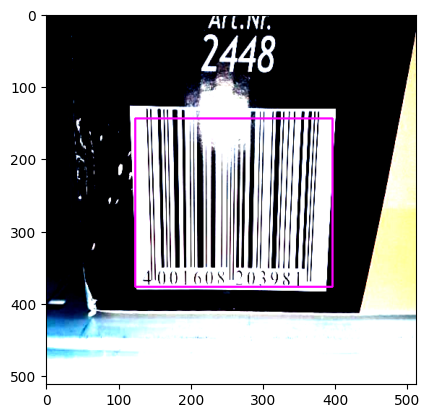

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


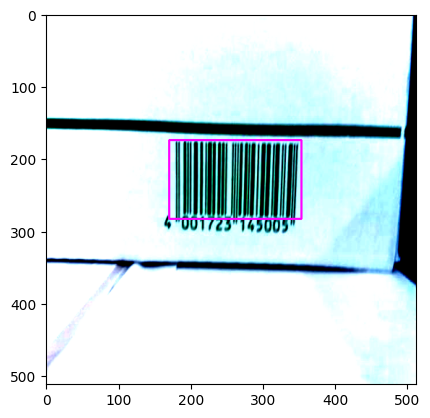

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


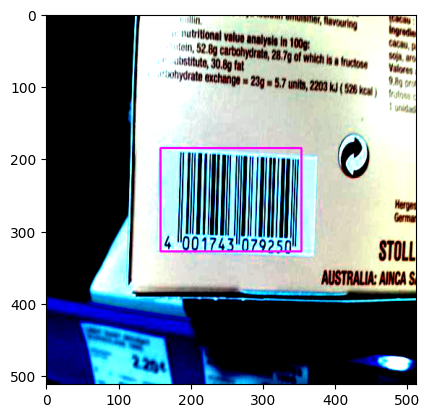

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


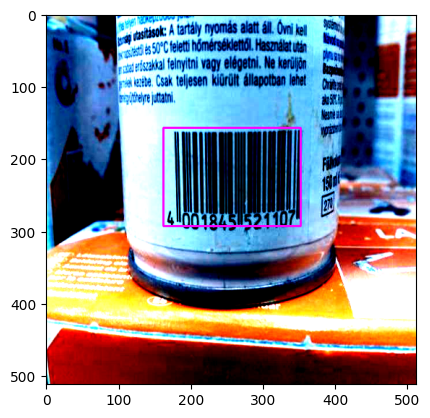

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


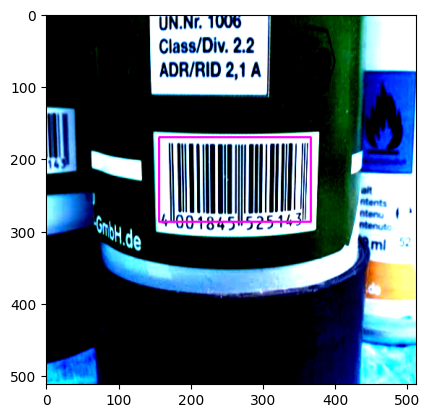

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


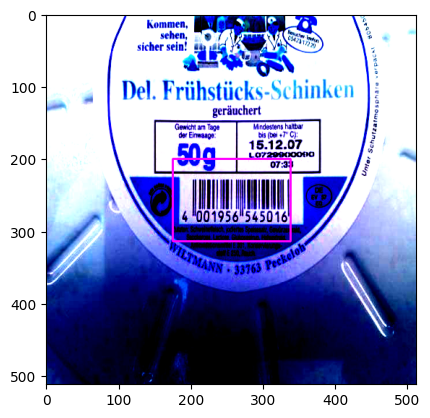

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


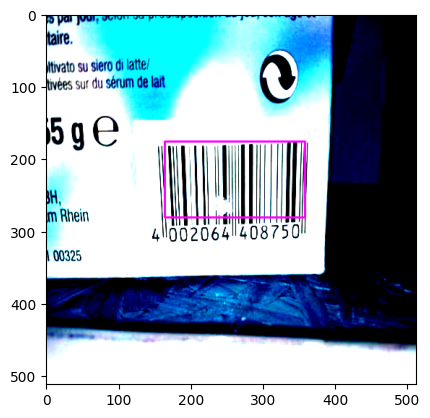

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


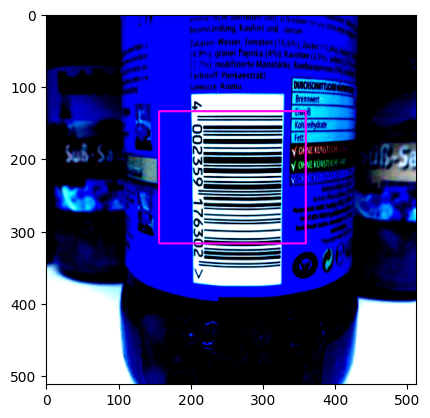

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


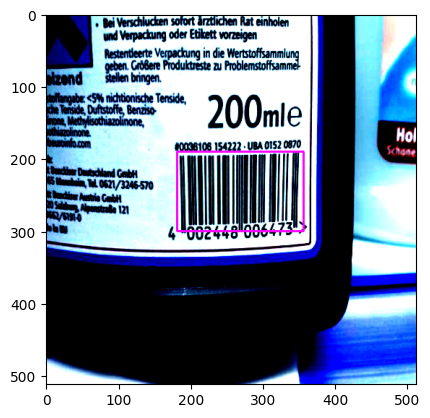

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


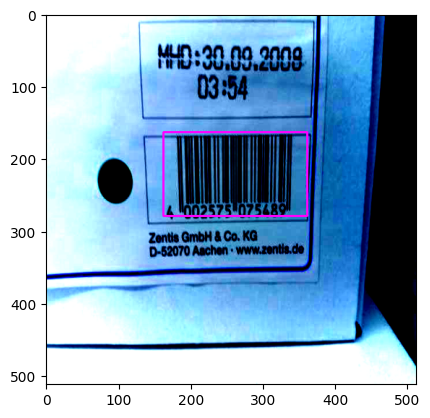

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..255.0].


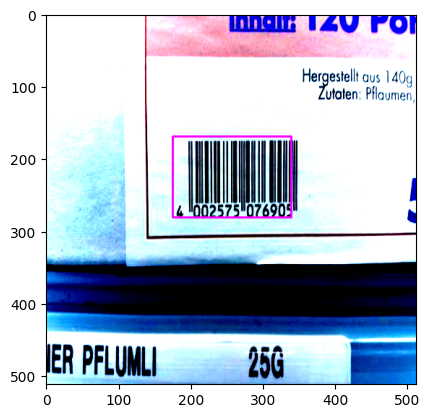

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


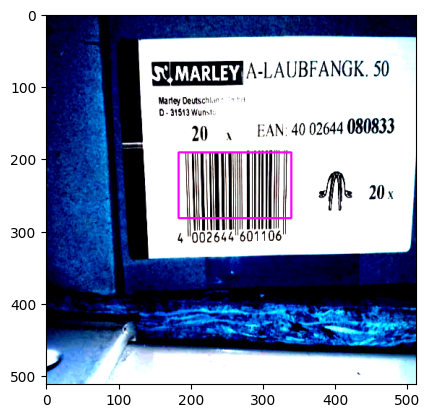

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


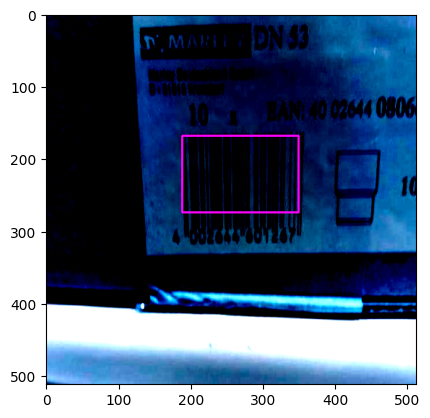

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


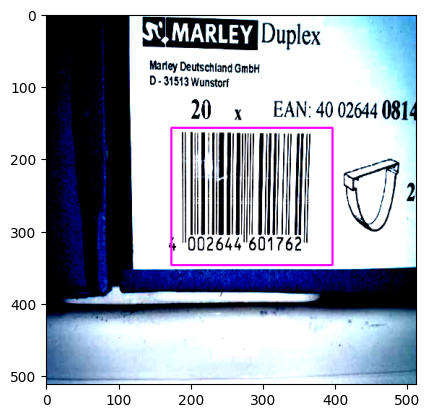

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


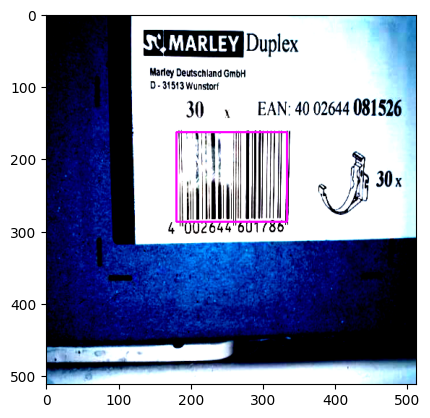

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


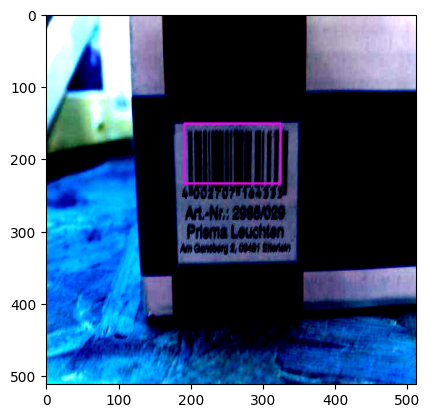

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..255.0].


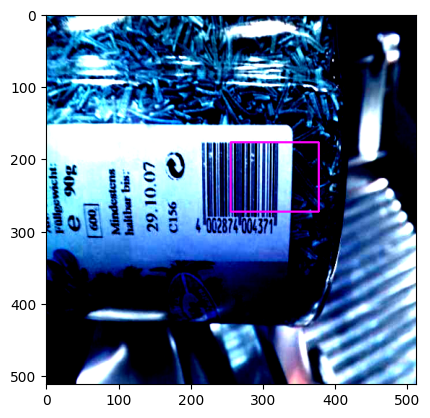

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9466563..255.0].


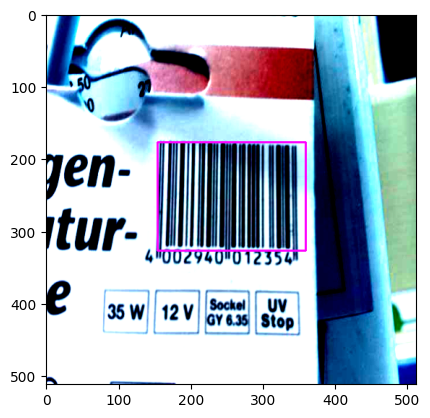

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


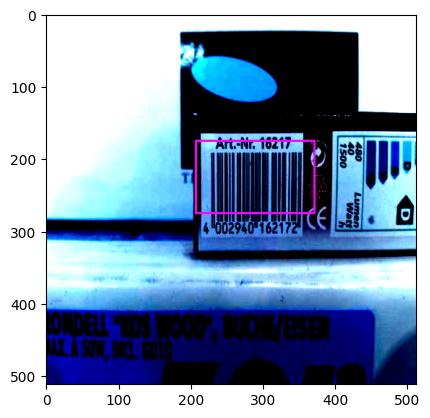

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


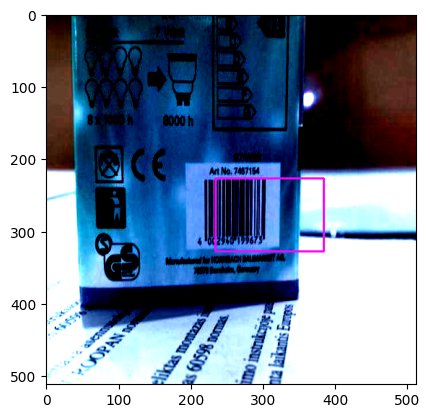

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


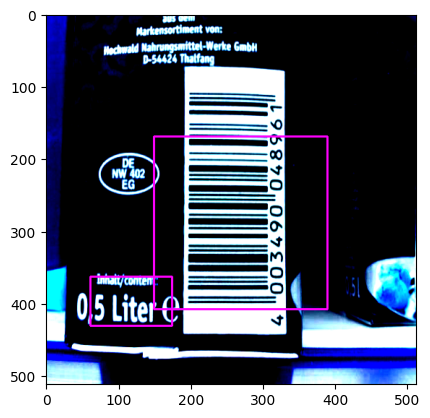

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


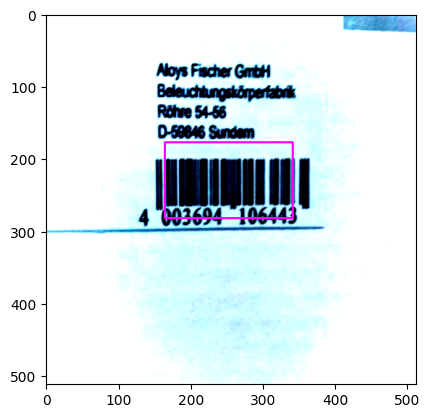

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


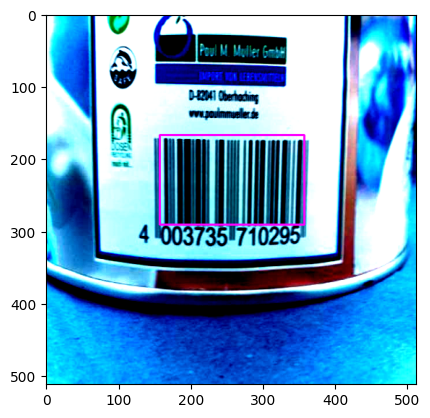

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0182073..255.0].


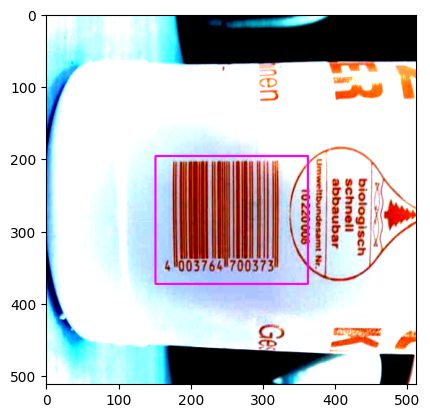

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


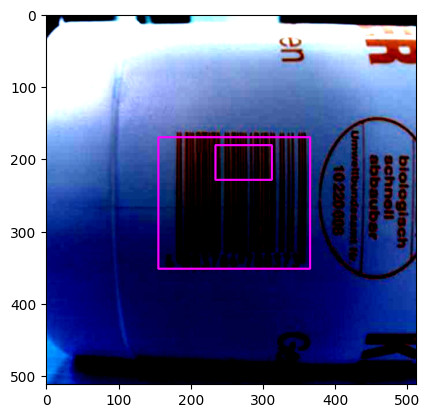

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


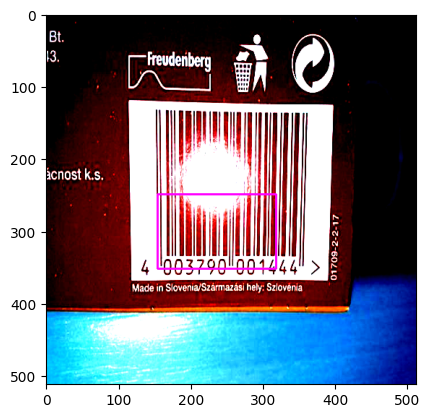

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


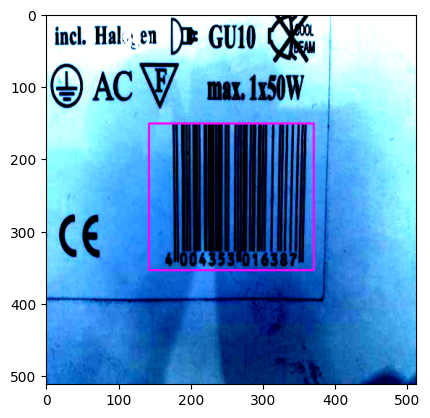

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665295..255.0].


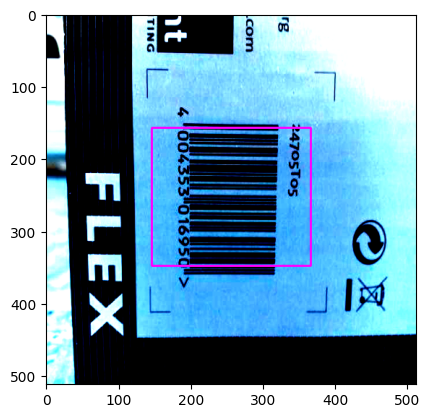

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665295..255.0].


(512, 512, 3)


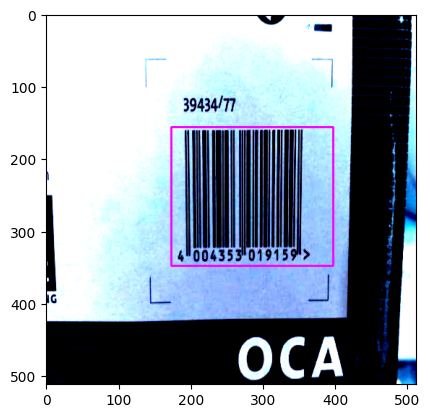

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


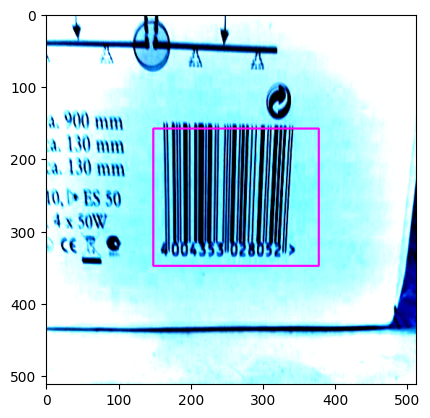

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


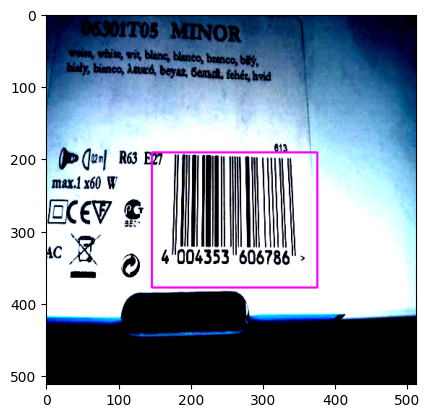

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


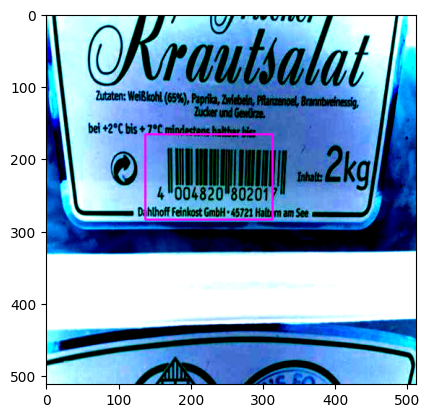

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


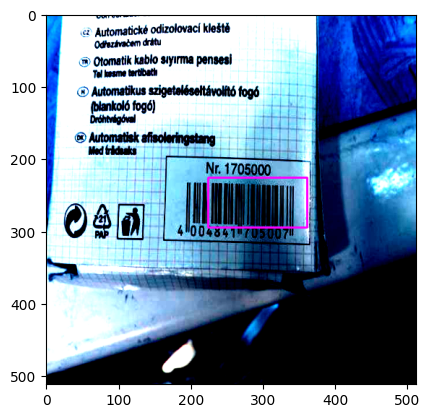

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


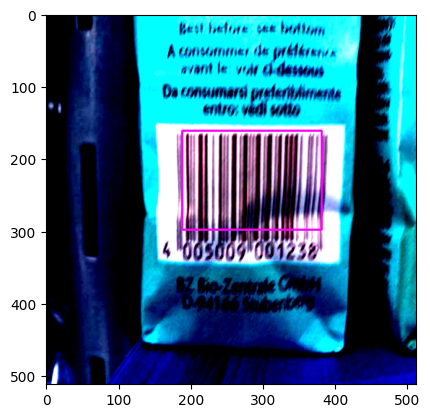

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9466563..255.0].


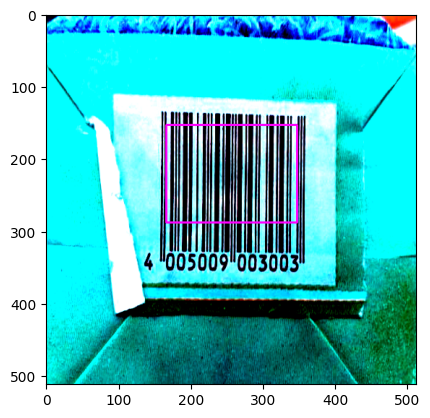

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


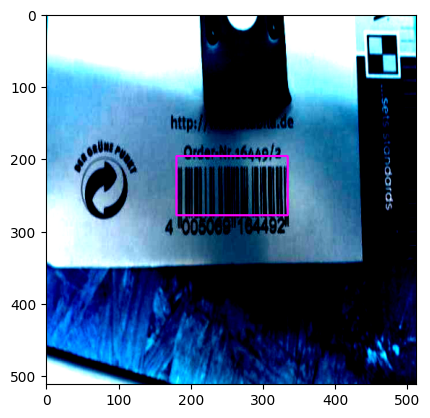

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


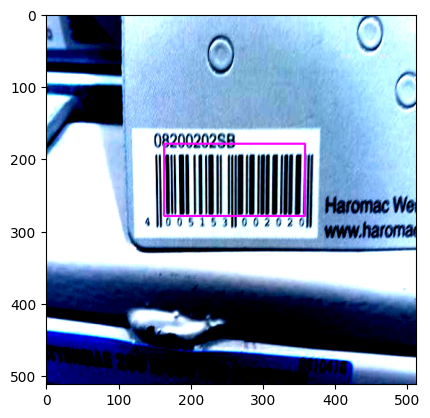

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..255.0].


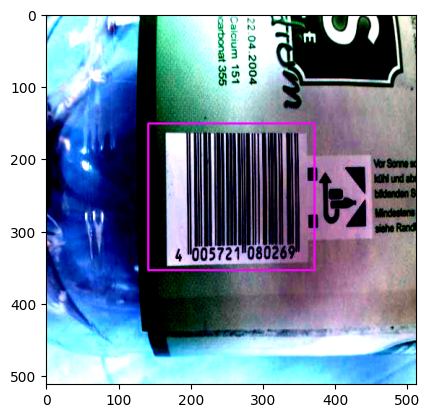

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


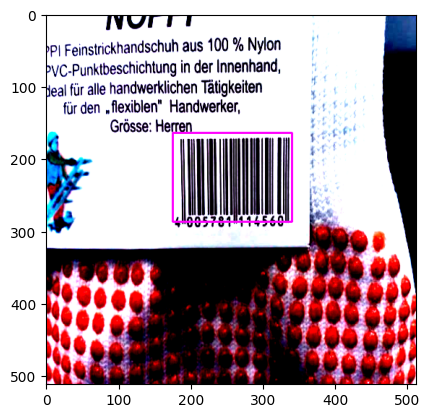

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


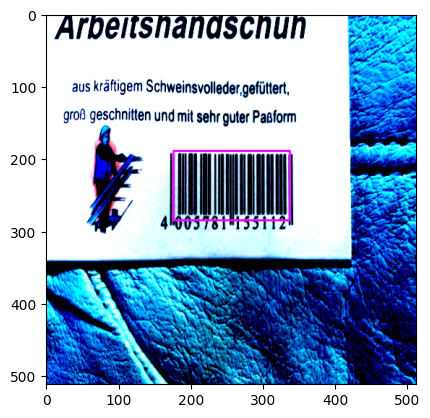

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


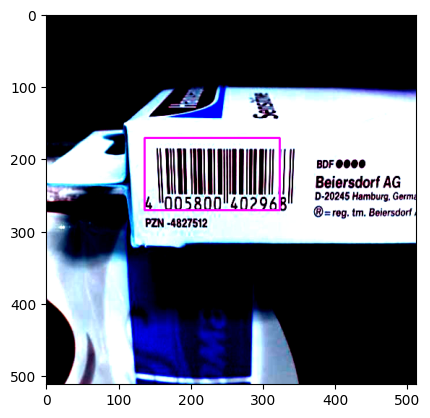

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357144..255.0].


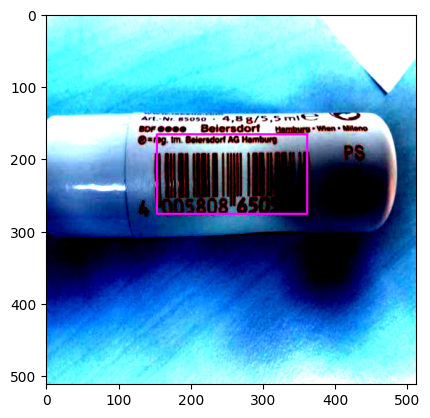

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6475817..255.0].


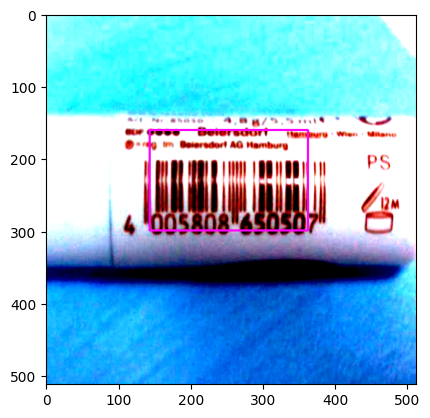

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.8610326..255.0].


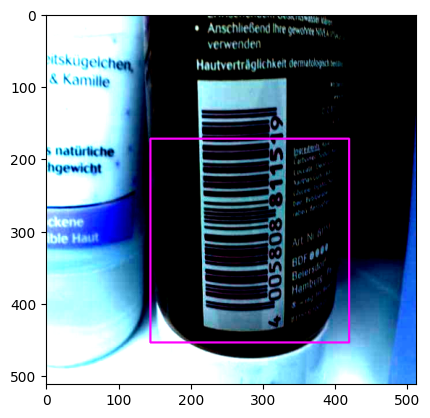

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


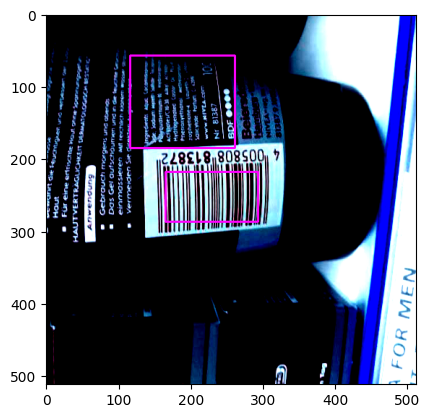

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


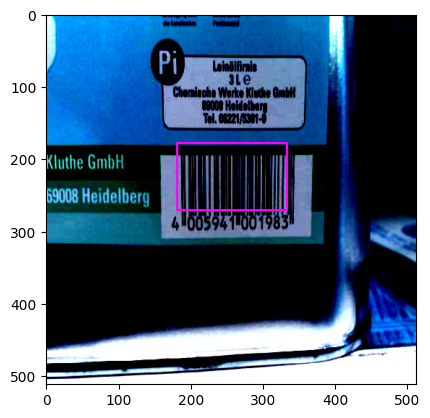

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


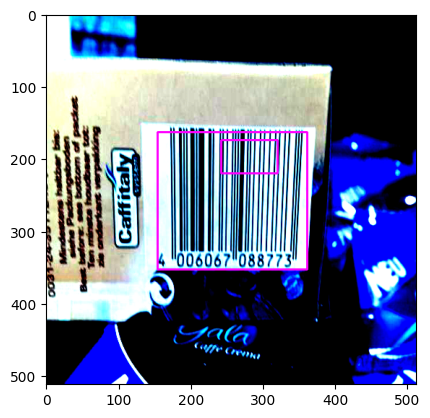

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


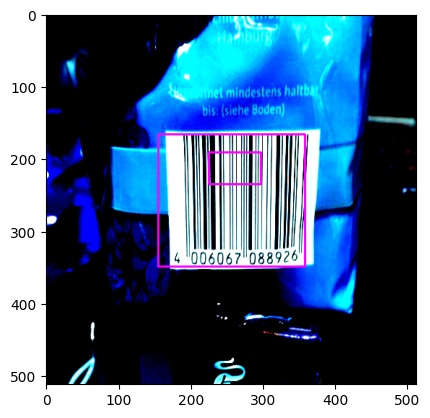

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..255.0].


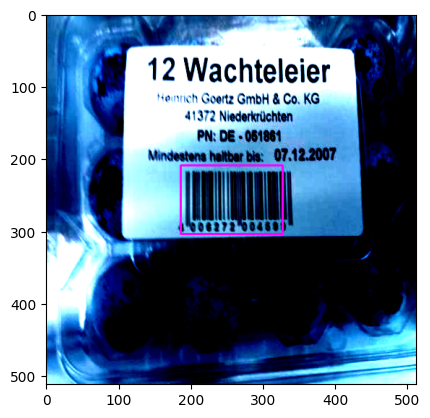

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


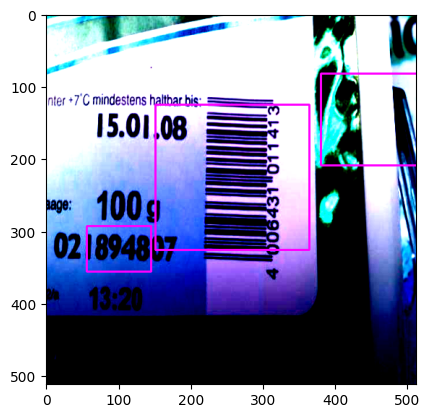

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..255.0].


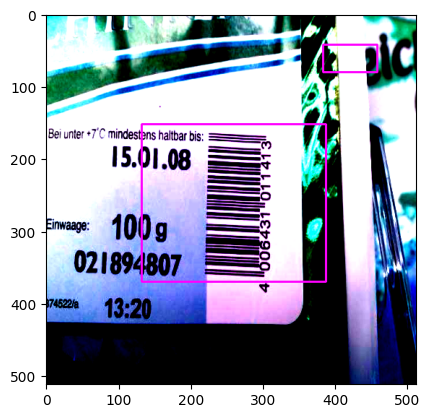

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


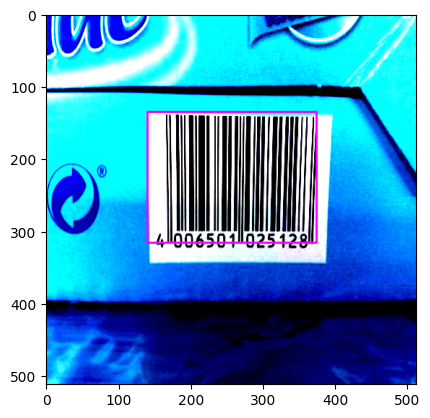

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


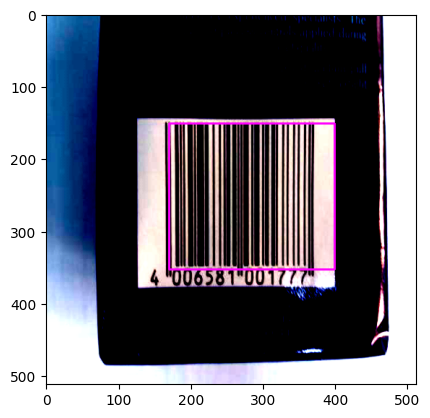

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0151553..255.0].


(512, 512, 3)


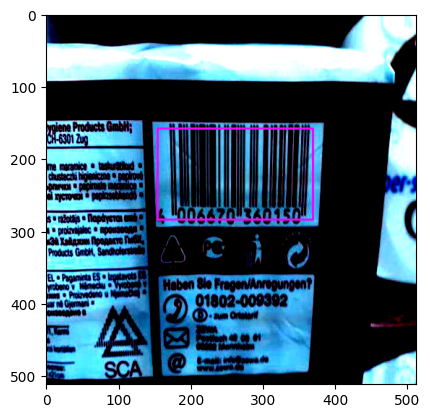

(512, 512, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..255.0].


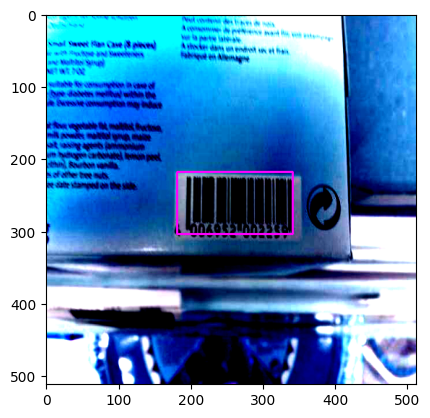

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..255.0].


(512, 512, 3)


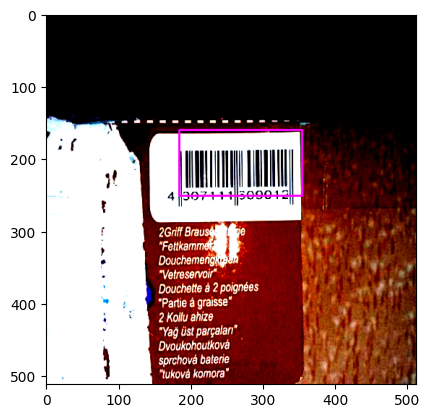

In [44]:
for id in range(90):
    img, hm_gt, offset_gt, regr_gt,hm_all = valdataset[id]
    sample = np.transpose(img,(1,2,0)).copy()
    print(sample.shape)
    image_shape = np.array(np.shape(img)[0:2])
    img = torch.from_numpy(img)
    with torch.no_grad():
        hm, offset, wh = model(img.to(device).float().unsqueeze(0))
    offset = offset.cpu().numpy().squeeze(0)
    wh = wh.cpu().numpy().squeeze(0)
    hm = torch.sigmoid(hm)
    outputs = decode_bbox(hm,torch.tensor(wh[None]).cuda(),torch.tensor(offset[None]).cuda())
    results = postprocess(outputs,True,[512, 512],image_shape, False, 0.1)
    try:
        top_label   = np.array(results[0][:, 5], dtype = 'int32')
        top_conf    = results[0][:, 4]
        top_boxes   = results[0][:, :4]
        for box in top_boxes:
            ymin = box[0]
            xmin = box[1]
            ymax = box[2]
            xmax = box[3]

            xmin = int(xmin)
            ymin = int(ymin)
            xmax = int(xmax)
            ymax = int(ymax)

            cv2.rectangle(sample,(xmin,ymin),(xmax,ymax),(255,0,255),2)
    except:
        pass
    plt.imshow(sample)
    plt.show()

In [ ]:
"""
Ground Truth of Validation

"""

for id in range(90):
    img, hm_gt, offset_gt, regr_gt,hm_all = valdataset[id]
    sample = np.transpose(img,(1,2,0)).copy()
    print(sample.shape)
    image_shape = np.array(np.shape(img)[0:2])
    img = torch.from_numpy(img)
    with torch.no_grad():
        hm, offset, wh  = model(img.to(device).float().unsqueeze(0))
    offset = offset.cpu().numpy().squeeze(0)
    wh = wh.cpu().numpy().squeeze(0)
    hm = torch.tensor(hm_gt)
    outputs = decode_bbox(hm[None].cuda(),torch.tensor(regr_gt[None]).cuda(),torch.tensor(offset_gt[None]).cuda())
    results = postprocess(outputs,True,[512, 512],image_shape, False, 0.3)
    top_label   = np.array(results[0][:, 5], dtype = 'int32')
    top_conf    = results[0][:, 4]
    top_boxes   = results[0][:, :4]
    #print(top_boxes)
    for box in top_boxes:
        ymin = box[0]
        xmin = box[1]
        ymax = box[2]
        xmax = box[3]

        xmin = int(xmin)
        ymin = int(ymin)
        xmax = int(xmax)
        ymax = int(ymax)

        cv2.rectangle(sample,(xmin,ymin),(xmax,ymax),(255,0,255),2)
    plt.imshow(sample)
    plt.show()